In [1]:
import torch
from torchinfo import summary
import pandas as pd
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
import os
import time
from codecarbon import EmissionsTracker
import datetime
import sys
from typing import Union
from scipy.optimize import minimize_scalar

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))
from models.encdec_model import EncDecModel
from models.stacked_rnn import Stacked_RNN
from src.dataset_module import SolarEfficientDataset
from src.preprocessing import SolarPreprocessor
from utils.experiment_manager import ExperimentManager
from utils.early_stopping import EarlyStopping
from auxiliary_models.brl_diffuse import BRL
from auxiliary_models.kasten_correction import Kasten_Correction
from loss_function.cpiloss import CPILoss
from loss_function.mseloss import MaskedMSELoss

# São Paulo

## Preparação da base de dados

In [2]:
CONFIG = {
    # --- 1. PATH DA BASE DE DADOS ---
    'csv_path': 'data/pv0.csv',
    
    # --- 2. DIVISÃO DA BASE DE TREINO, TESTE E VALIDAÇÃO ---
    'split_ratios': {'train': 0.8, 'val': 0.2}, 
    'test_year':2022,

    # --- 3. PRÉ-PROCESSAMENTO (Física & Mapeamento) ---
    'preprocessing': {
        'latitude': -23.56,
        'longitude': -46.73,
        'altitude': 0,
        'timezone': 'Etc/GMT+3',
        'nominal_power': 156.0,
        'start_year': 2015,
        'features_to_scale':['temp_amb','wind_speed'],
        #'pv_power_col_csv': 'Pot_BT', # <--- AVALIAR PARA RETIRAR
        
        # DOCUMENTAÇÃO VIVA: Mapeamento "De -> Para"
        # O Preprocessor usará isso para renomear as colunas internamente.
        # Chave (Esquerda): Nome como está no CSV bruto.
        # Valor (Direita): Nome padronizado usado no código.
        'column_mapping': {
            'Pot_BT': 'target',
            'Irradiação Global horária(horizontal) kWh/m2': 'ghi',
            'Irradiação Difusa horária kWh/m2': 'dhi',
            'Irradiação Global horária(Inclinada 27°) kWh/m2': 'irrad_poa',
            'Temperatura ambiente °C': 'temp_amb',
            'Umidade Relativa %': 'humidity',
            'Velocidade média do vento m/s': 'wind_speed'
        }
    },

    # --- 4. ESTRATÉGIA DE MODELAGEM ---
    # mode: 'sky' (prevê k) ou 'power' (prevê kW normalizado)
    'prediction_mode': 'sky',
    
    # Qual variável o modelo vai prever? ('k' ou 'target')
    'target_col': ['kt', 'fracao_difusa'], 
    
    # Features de entrada
    'feature_cols': [
        'cos_zenith', 'elevation', 'delta_kt', 
        'delta_fracao_difusa', 'QS', 'mask'
    ],
    
    'aux_col':[
        'ghi_cs', 'cos_zenith', 
        'elevation', 'ghi_extra'
    ],

    # --- 5. ARQUITETURA E TREINO ---
    'model_type': 'Teste_2',
    'cell_type': 'lstm',
    'input_seq_len': 24,
    'output_seq_len': 1,
    'hidden_sizes': [128, 64],
    'learning_rate': 0.001,
    'batch_size': 32,
    'epochs': 100,
    'dropout': 0.1,
    'bidirectional': False,
    'use_attention': False,
    'use_feature_attention': False,
    'patience': 10,
    'loss_function':'mse',      # "cpi_loss", "mse"
    'use_mask':True
}

OUTPUT_ROOT = 'trained_models'
ARTIFACTS_DIR = 'artifacts'
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
# 1. Setup
timestamp = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
exp_name = f"{timestamp}_{CONFIG['model_type']}"
exp_dir = os.path.join(OUTPUT_ROOT, exp_name)
os.makedirs(exp_dir, exist_ok=True)
os.makedirs(ARTIFACTS_DIR, exist_ok=True)

# 2. Leitura
#csv_path = CONFIG['data/pv0.csv']
#print(f"⏳ Lendo: {csv_path}")
df = pd.read_csv('/workspaces/Remodelacao_mestrado/data/pv0.csv')


if 'Date_Time' in df.columns:
    df['Date_Time'] = pd.to_datetime(df['Date_Time'])
    #df['Date_Time'] -=  pd.Timedelta(minutes=30)
    df = df.drop_duplicates(subset=['Date_Time'], keep='first').set_index('Date_Time').sort_index()
df = df[~df.index.duplicated(keep='first')]

# 3. Pré-processamento
pp_conf = CONFIG['preprocessing']

# Instancia passando o mapa explícito. 
# Isso garante que a padronização aconteça conforme o CONFIG acima.
preprocessor = SolarPreprocessor(
    latitude=pp_conf['latitude'], 
    longitude=pp_conf['longitude'], 
    altitude=pp_conf['altitude'],
    timezone=pp_conf['timezone'], 
    nominal_power=pp_conf['nominal_power'], 
    start_year=pp_conf['start_year'],
    cs_model = 'esra',
    features_to_scale=pp_conf['features_to_scale'],
    target_col=CONFIG['prediction_mode'], # <--- unica variavel que não vem do preprocessing
    column_mapping=pp_conf['column_mapping'],
    kasten_corr=True
)

preprocessor.fit(df)
preprocessor.save_scalers(exp_dir)
preprocessor.save_scalers(ARTIFACTS_DIR)

# O método transform usa o column_mapping para renomear as colunas
df_processed = preprocessor.transform(df)

💾 Scalers salvos em: trained_models/2026-03-13_18-30-18_Teste_2
💾 Scalers salvos em: artifacts
Otimizando TL para 381 dias selecionados...
Otimização concluída. Média TL: 6.28


In [5]:
qs = 1 - np.sqrt( (1 - df_processed['kt'])**2 + (df_processed['fracao_difusa'])**2 + (df_processed['VS_cdf'])**2 ) / np.sqrt(3)
df_processed['QS_n'] = qs

In [4]:
df_day = df_processed.loc[df_processed['mask'] == 1]
df_day = df_day.groupby(df_day.index.date).apply(lambda x: pd.Series({
    'kt_diario': x['ghi'].sum()/ x['ghi_extra'].sum(),
    'fracao_difusa_diaria': x['dhi'].sum()/ x['ghi'].sum()
}))
#df_day.index = df_day.index + pd.Timedelta(minutes=30)
df_day.head()

,kt_diario,fracao_difusa_diaria
2015-06-13,0.679554,0.136635
2015-06-14,0.627953,0.174044
2015-06-16,0.392204,0.815634
2015-06-17,0.439682,0.856763
2015-06-18,0.574933,0.313941


In [24]:
def cluster(kth, kdh):
    # Predefined matrices
    KT_MEAN_MATRIX = np.array([0.065, 0.134, 0.217, 0.299, 0.347, 0.392, 0.42, 0.464, 0.493, 0.526, 0.558, 0.581, 0.622, 0.647, 0.678, 0.695, 0.713, 0.733, 0.761, 0.795])
    KT_STD_MATRIX = np.array([0.018, 0.028, 0.042, 0.05, 0.062, 0.063, 0.067, 0.076, 0.071, 0.081, 0.071, 0.069, 0.061, 0.057, 0.048,0.043, 0.035, 0.027, 0.018, 0.013])
    
    K_MEAN_MATRIX = np.array([1.004, 0.998, 0.981, 0.956, 0.896, 0.845, 0.769, 0.698, 0.645, 0.57, 0.527, 0.458, 0.409, 0.352, 0.3, 0.252, 0.209, 0.164, 0.117, 0.092])
    K_STD_MATRIX = np.array([0.007, 0.008, 0.041, 0.034, 0.051, 0.048, 0.055, 0.068, 0.056, 0.071, 0.06, 0.058, 0.052, 0.052, 0.048, 0.042, 0.033, 0.025, 0.018, 0.009])
    DC = list()

    for kt, k in zip(kth, kdh):
        VAL_KT = np.exp(-((kt - KT_MEAN_MATRIX)**2) / (2 * KT_STD_MATRIX)**2)
        VAL_K = np.exp(-((k - K_MEAN_MATRIX)**2) / (2 * K_STD_MATRIX)**2)
        VAL = VAL_K * VAL_KT

        x = np.argmax(VAL)
        if x <= 1: DC.append(0)
        elif (x > 1) & (x <= 3): DC.append(1)
        elif (x > 3) & (x <= 6): DC.append(2)
        elif (x > 6) & (x <= 10): DC.append(3)
        elif (x > 10) & (x <= 14): DC.append(4)
        elif (x > 14) : DC.append(5)
          

    return DC

result = cluster(df_day['kt_diario'].values, df_day['fracao_difusa_diaria'].values)
df_day['cluster'] = result
df_day.head()


,kt_diario,fracao_difusa_diaria,cluster
2015-06-13,0.679554,0.136635,5
2015-06-14,0.627953,0.174044,5
2015-06-16,0.392204,0.815634,2
2015-06-17,0.439682,0.856763,2
2015-06-18,0.574933,0.313941,4


<Axes: xlabel='kt_diario', ylabel='fracao_difusa_diaria'>

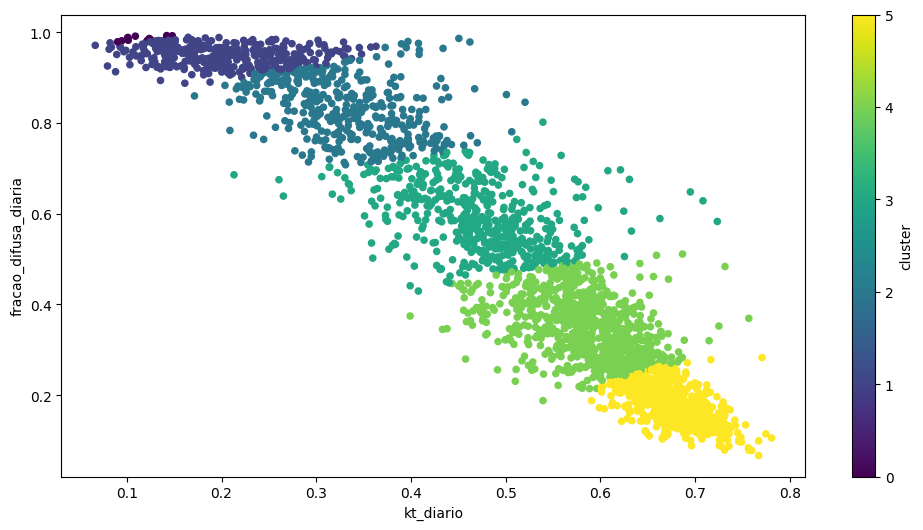

In [28]:
df_day.plot.scatter(x='kt_diario', y='fracao_difusa_diaria', c='cluster', cmap='viridis', figsize=(12, 6))


In [7]:
import numpy as np

# Predefined matrices
KT_MEAN_MATRIX = np.array([0.30, 0.25, 0.20, 0.16, 0.11, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09])
KT_STD_MATRIX = np.array([0.007, 0.008, 0.041, 0.034, 0.051, 0.048, 0.055, 0.068, 0.056, 0.071, 0.060, 0.058, 0.052, 0.052, 0.048, 0.042, 0.033, 0.025, 0.018, 0.009])
K_MEAN_MATRIX = np.array([0.30, 0.25, 0.20, 0.16, 0.11, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09])
K_STD_MATRIX = np.array([0.007, 0.008, 0.041, 0.034, 0.051, 0.048, 0.055, 0.068, 0.056, 0.071, 0.060, 0.058, 0.052, 0.052, 0.048, 0.042, 0.033, 0.025, 0.018, 0.009])

def verysimpledayclassifier(kth, kh):
    VAL_KT = np.exp(-((kth - KT_MEAN_MATRIX)**2) / (2 * KT_STD_MATRIX)**2)
    VAL_K = np.exp(-((kh - K_MEAN_MATRIX)**2) / (2 * K_STD_MATRIX)**2)
    VAL = VAL_K * VAL_KT
    DC = np.argmax(VAL)
    return DC

# Example usage:
result = verysimpledayclassifier(df_day['kt_diario'].values, df_day['fracao_difusa_diaria'].values)

ValueError: operands could not be broadcast together with shapes (2595,) (20,) 

In [7]:
import pandas as pd
import numpy as np

def classificador_qs(valor_qs):
    # Valores de 'Normalized QS' extraídos da coluna mu da sua tabela
    thresholds = [
        0.2176, 0.2531, 0.2887, 0.3243, 0.3598, 0.3954, 0.4310, 0.4666, 0.5021, 
        0.5377, 0.5733, 0.6088, 0.6444, 0.6800, 0.7155, 0.7511, 0.7867, 0.8222, 
        0.8578, 0.8934
    ]
    
    # Calculamos os pontos médios entre os valores para criar os limites (bins)
    bins = [0] # Limite inferior inicial
    for i in range(len(thresholds) - 1):
        ponto_medio = (thresholds[i] + thresholds[i+1]) / 2
        bins.append(ponto_medio)
    bins.append(1.0) # Limite superior final
    
    # Rótulos para as classes DCC-D de 1 a 20
    labels = list(range(1, 21))
    
    # Encontra em qual intervalo o valor se encaixa
    # np.digitize retorna o índice do bin correspondente
    classe = np.digitize(valor_qs, bins)
    
    # Garante que fique dentro do range 1-20
    return max(1, min(classe, 20))

# --- Exemplo de Teste ---
#df_processed['DCC-D'] = df_processed['QS_n'].apply(classificador_qs)

## AOD 550


In [18]:
pip install pygrib cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 6.3 MB/s  0:00:01 eta 0:00:010:01:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 16.5 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [cartopy]━━━━━━━━━━ 2/3 [cartopy]
Note: you may need to restart the kernel to use updated packages.


In [8]:
import pygrib
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Abrir o arquivo
path = "/workspaces/Remodelacao_mestrado/data/eac4/aod550.grib"
grbs = pygrib.open(path)


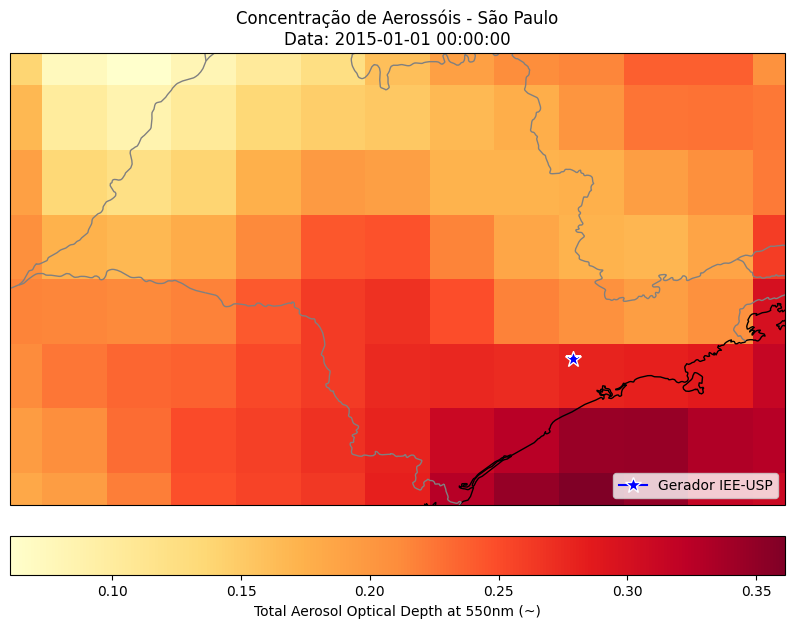

In [9]:
import pygrib
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature # Para adicionar divisas de estados
import numpy as np

# Abrir o arquivo
grbs = pygrib.open(path)
grb = grbs.read(1)[0] 

data = grb.values
lats, lons = grb.latlons()

# 1. Definir os limites automaticamente com base nos seus dados
lat_min, lat_max = lats.min(), lats.max()
lon_min, lon_max = lons.min(), lons.max()

# Configuração do Plot
plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# 2. LIMITAR A EXTENSÃO DO MAPA
# [lon_inicial, lon_final, lat_inicial, lat_final]
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# 3. Adicionar detalhes geográficos mais precisos
# '10m' é a resolução de alta qualidade (10 metros)
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='10m',
    facecolor='none'
)

ax.add_feature(cfeature.COASTLINE, linestyle='-', edgecolor='black')
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(states_provinces, edgecolor='gray') # Adiciona as divisas de SP e vizinhos

# Plotar os dados
#contour = plt.contourf(lons, lats, data, 60, transform=ccrs.PlateCarree(), cmap='YlOrRd')
contour = plt.pcolormesh(lons, lats, data, transform=ccrs.PlateCarree(), cmap='YlOrRd')
plt.colorbar(contour, label=f"{grb.name} ({grb.units})", orientation='horizontal', pad=0.05)

# Coordenadas do IEE-USP (convertidas para decimais)
lat_gerador = -23.557975
lon_gerador = -46.734528

# Adicionar o ponto no mapa
ax.plot(lon_gerador, lat_gerador, marker='*', color='blue', markersize=12, 
        transform=ccrs.PlateCarree(), label='Gerador IEE-USP', markeredgecolor='white')

# Adicionar uma legenda
plt.legend(loc='lower right')

plt.title(f"Concentração de Aerossóis - São Paulo\nData: {grb.validDate}")
plt.show()

grbs.close()

In [10]:
import pandas as pd
import pygrib

def grib_to_dataframe(file_path):
    grbs = pygrib.open(file_path)
    data_list = []

    for grb in grbs:
        # Extrair valores, latitudes e longitudes
        values = grb.values
        lats, lons = grb.latlons()
        
        # Criar um dataframe temporário para esta "camada" de tempo/variável
        temp_df = pd.DataFrame({
            'datetime': grb.validDate,
            'latitude': lats.ravel(),
            'longitude': lons.ravel(),
            'variable': grb.shortName,
            'value': values.ravel()
        })
        data_list.append(temp_df)
    
    grbs.close()
    
    # Concatenar tudo e pivotar se quiser as variáveis em colunas separadas
    full_df = pd.concat(data_list, ignore_index=True)
    
    # Opcional: Pivotar para ter cada variável (ex: aod550, bcaod) como coluna
    final_df = full_df.pivot_table(
        index=['datetime', 'latitude', 'longitude'], 
        columns='variable', 
        values='value'
    ).reset_index()
    
    return final_df

df_aerossois = grib_to_dataframe(path)
# Converter de UTC para o horário de Brasília (UTC-3)
df_aerossois['datetime'] = pd.to_datetime(df_aerossois['datetime'])
df_aerossois['datetime_local'] = df_aerossois['datetime'].dt.tz_localize('UTC')
df_aerossois['datetime_local'] = df_aerossois['datetime_local'].dt.tz_convert('Etc/GMT+3')
print(df_aerossois.head())

variable   datetime  latitude  longitude    aod550            datetime_local
0        2015-01-01    -25.26     -53.27  0.182863 2014-12-31 21:00:00-03:00
1        2015-01-01    -25.26     -52.52  0.195204 2014-12-31 21:00:00-03:00
2        2015-01-01    -25.26     -51.77  0.219887 2014-12-31 21:00:00-03:00
3        2015-01-01    -25.26     -51.02  0.248113 2014-12-31 21:00:00-03:00
4        2015-01-01    -25.26     -50.27  0.255769 2014-12-31 21:00:00-03:00


In [11]:
lat_alvo = -23.557975
lon_alvo = -46.734528

data, lats, lons = grb.data()

df_aerossois['distancia'] = np.sqrt((df_aerossois['latitude'] - lat_alvo)**2 + (df_aerossois['longitude'] - lon_alvo)**2)
idx_lat, idx_lon = df_aerossois[['latitude','longitude']].loc[df_aerossois['distancia'] == np.min(df_aerossois['distancia'])].values[0]
df_aod = df_aerossois.loc[(df_aerossois['latitude'] == idx_lat) &
                          (df_aerossois['longitude'] == idx_lon)]

del(df_aerossois)

In [12]:
df_aod = df_aod[['aod550', 'datetime_local']].set_index('datetime_local', drop= True)

In [ ]:
df_aod = df_aod.resample('1H').asfreq()
df_1 = df_aod.interpolate(method = 'cubic')

df_2 = df_aod.copy()
climatologia = df_2.groupby(df_2.index.hour).mean()
df_2['clim'] = climatologia
df_2['fator'] = df_2['aod550'] / df_2['clim']

df_2 = df_2.resample('1H').asfreq()
df_2['fator_interp'] = df_2['fator'].interpolate(method='linear')
df_2['AOD_final'] = df_2.index.hour.map(climatologia) * df_2['fator_interp']

ValueError: Data must be 1-dimensional, got ndarray of shape (24, 1) instead

In [25]:
df_processed = pd.merge(df_processed, df_aod, how = 'left', left_index = True, right_index = True)
df_processed.index -=  pd.Timedelta(minutes=30)

In [26]:
df_processed.head()

,target,ghi,irrad_poa,temp_amb,humidity,wind_speed,Pressão Baromêtrica mm Hg,Pluviômetro mm,zenith,apparent_zenith,...,P1,P2,P3,irr_clearsky_ratio,delta_kt,delta_fracao_difusa,VS_cdf,p,QS_n,aod550
Date_Time,,,,,,,,,,,,,,,,,,,,,
2015-06-11 17:30:00-03:00,0.0,0.0,0.0,0.615437,0.6308,0.041431,616.8,0.0,97.626451,97.626451,...,0.0,0.0,0.0,0.0,0.0,0.0,0.002,-6327.030194,0.422649,0.074152
2015-06-11 18:30:00-03:00,0.0,0.0,0.0,0.717369,0.6113,0.001412,595.9,0.0,110.587917,110.587917,...,0.0,0.0,0.0,0.0,0.0,0.0,0.002,-6327.030194,0.422649,NaN
2015-06-11 19:30:00-03:00,0.0,0.0,0.0,0.787773,0.5979,0.000000,576.9,0.0,123.868873,123.868873,...,0.0,0.0,0.0,0.0,0.0,0.0,0.002,-6327.030194,0.422649,NaN
2015-06-11 20:30:00-03:00,0.0,0.0,0.0,0.802803,0.5949,0.000000,563.7,0.0,137.362677,137.362677,...,0.0,0.0,0.0,0.0,0.0,0.0,0.002,-6327.030194,0.422649,0.077996
2015-06-11 21:30:00-03:00,0.0,0.0,0.0,0.799073,0.5950,0.000000,554.7,0.0,150.995594,150.995594,...,0.0,0.0,0.0,0.0,0.0,0.0,0.002,-6327.030194,0.422649,NaN


## Self Organization Maps

In [4]:
pip install minisom

Note: you may need to restart the kernel to use updated packages.


### Solar + Meteo

In [35]:
from minisom import MiniSom

#============================
#   --- Dados Kt, K, VS ---
#      (Quality Control)
#============================

df_teste_sol = df_processed.loc[(df_processed.index.year < 2022) & (df_processed['mask'] == 1)]

df_teste_sol_gb = df_teste_sol.groupby(df_teste_sol.index.date).agg({
    'kt': ['mean', 'var'],
    'fracao_difusa': ['mean', 'var'],
    'VS_cdfn':['mean', 'var']
})
df_teste_sol_gb.columns = ['kt_mean', 'kt_var', 
                           'kd_mean', 'kd_var', 
                           'VS_mean', 'VS_var']

df_teste_sol_gb = df_teste_sol_gb.dropna() # Remover dias com falhas

#===========================
#   --- Dados Meteo ---
#===========================

df_teste_meteo = df_processed.loc[(df_processed.index.year < 2022)]

df_teste_meteo_gb = df_teste_meteo.groupby(df_teste_meteo.index.date).agg({
    'humidity':['mean', 'var'],
    'temp_amb': [lambda x: x.max() - x.min()],
    #'aod550':['mean']
})

df_teste_meteo_gb.columns = ['rh_mean', 'rh_var', 
                             'ta_amplitude', 
                             #'aod_mean'
                             ]

df_teste_meteo_gb = df_teste_meteo_gb.dropna()

#=============================
#   --- Junção dos Dados ---
#=============================
df_teste_gb = pd.merge(df_teste_sol_gb, df_teste_meteo_gb, 
                        right_index=True, 
                        left_index=True,
                        how='inner')

data_to_som = df_teste_gb.values

Grade      | QE         | TE         | Min Dias   | Max Dias  
------------------------------------------------------------
2x2        | 0.1317     | 0.0000     | 431        | 613       
2x3        | 0.1115     | 0.0000     | 272        | 449       
3x3        | 0.0995     | 0.1615     | 117        | 338       
3x4        | 0.0922     | 0.1050     | 67         | 261       
4x4        | 0.0859     | 0.1322     | 71         | 243       
4x5        | 0.0822     | 0.1927     | 49         | 219       
5x5        | 0.0774     | 0.2568     | 2          | 146       
5x6        | 0.0742     | 0.2101     | 2          | 118       
6x6        | 0.0719     | 0.1638     | 2          | 135       
6x7        | 0.0689     | 0.2056     | 2          | 113       
7x7        | 0.0660     | 0.2572     | 2          | 95        


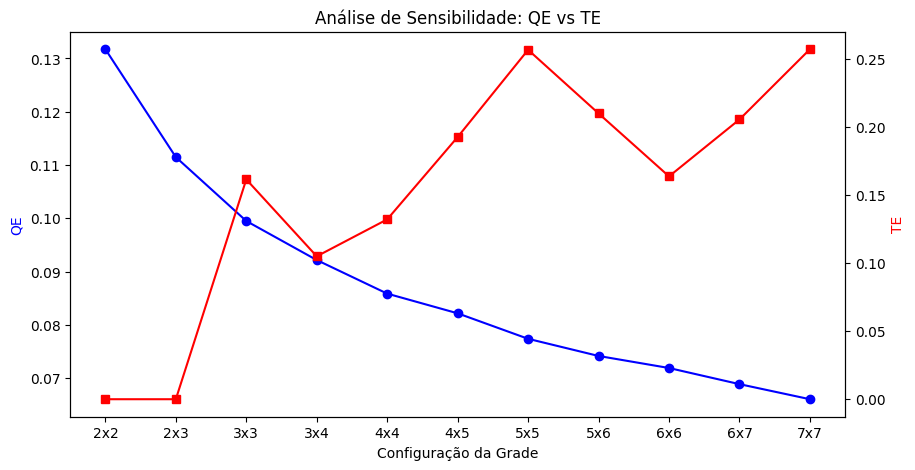

In [37]:
import pandas as pd
import numpy as np
from minisom import MiniSom
import matplotlib.pyplot as plt

# Dimensões para testar
grids = [(2, 2), (2, 3), (3, 3), (3, 4), (4, 4), (4, 5), (5, 5), (5, 6), (6, 6), (6, 7), (7, 7)]
results = []

print(f"{'Grade':<10} | {'QE':<10} | {'TE':<10} | {'Min Dias':<10} | {'Max Dias':<10}")
print("-" * 60)

for x, y in grids:
    # Inicialização e Treino
    som = MiniSom(x, y, data_to_som.shape[1], sigma=1.0, learning_rate=0.5, random_seed=42)
    som.pca_weights_init(data_to_som)
    som.train_random(data_to_som, num_iteration=5000, verbose=False)
    
    # Cálculos
    qe = som.quantization_error(data_to_som)
    te = som.topographic_error(data_to_som)
    
    # Distribuição de Frequência
    winner_coordinates = np.array([som.winner(x) for x in data_to_som])
    cluster_ids = winner_coordinates[:, 0] * y + winner_coordinates[:, 1]
    counts = pd.Series(cluster_ids).value_counts()
    
    results.append({
        'grid': f'{x}x{y}',
        'qe': qe,
        'te': te,
        'counts': counts
    })
    
    print(f"{f'{x}x{y}':<10} | {qe:<10.4f} | {te:<10.4f} | {counts.min():<10} | {counts.max():<10}")

# Plot comparativo de QE e TE
fig, ax1 = plt.subplots(figsize=(10, 5))
nodes = [r['grid'] for r in results]
qes = [r['qe'] for r in results]
tes = [r['te'] for r in results]

ax1.plot(nodes, qes, 'b-o', label='Quantization Error (QE)')
ax1.set_xlabel('Configuração da Grade')
ax1.set_ylabel('QE', color='b')

ax2 = ax1.twinx()
ax2.plot(nodes, tes, 'r-s', label='Topographic Error (TE)')
ax2.set_ylabel('TE', color='r')

plt.title('Análise de Sensibilidade: QE vs TE')
plt.show()

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 0.09032207099233257
             kt_mean    kt_var   kd_mean    kd_var   VS_mean    VS_var  \
2015-06-13  0.685277  0.012047  0.142296  0.000842  0.070659  0.000850   
2015-06-14  0.605509  0.010481  0.224970  0.035110  0.107754  0.001706   
2015-06-16  0.379081  0.013876  0.837211  0.007547  0.225967  0.011936   
2015-06-17  0.439925  0.015305  0.874979  0.012392  0.227742  0.007688   
2015-06-18  0.561303  0.016125  0.380346  0.076054  0.176102  0.006230   

             rh_mean    rh_var  ta_amplitude  cluster_id  
2015-06-13  0.686892  0.044254      0.148943           1  
2015-06-14  0.624721  0.022335      0.136739           0  
2015-06-16  0.812913  0.007374      0.066222           7  
2015-06-17  0.788754  0.016348      0.113233           6  
2015-06-18  0.785942  0.029244      0.135609           5  


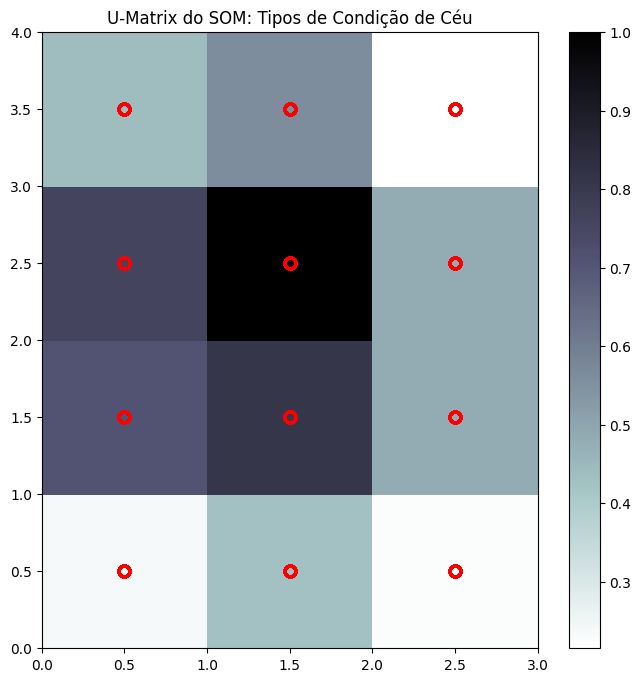

In [38]:
# Configurações do SOM
som_grid_x = 3
som_grid_y = 4
input_len = data_to_som.shape[1] # Deve ser 6

som = MiniSom(som_grid_x, som_grid_y, input_len, sigma=1.0, learning_rate=0.5)

# Inicialização dos pesos e treinamento
som.pca_weights_init(data_to_som)
som.train_random(data_to_som, num_iteration=5000, verbose=True)

# Função para mapear cada dia para um ID de cluster
def get_cluster_id(sample):
    w = som.winner(sample)
    return w[0] * som_grid_y + w[1]

# Criando a coluna de grupo
df_teste_gb['cluster_id'] = [get_cluster_id(x) for x in data_to_som]

print(df_teste_gb.head())

plt.figure(figsize=(8, 8))
plt.pcolor(som.distance_map().T, cmap='bone_r')  # Plot da distância entre neurônios
plt.colorbar()

# Adicionando marcadores para os dias
for i, x in enumerate(data_to_som):
    w = som.winner(x)
    plt.plot(w[0] + 0.5, w[1] + 0.5, 'o', markerfacecolor='None', 
             markeredgecolor='r', markersize=8, markeredgewidth=2)

plt.title('U-Matrix do SOM: Tipos de Condição de Céu')
plt.show()

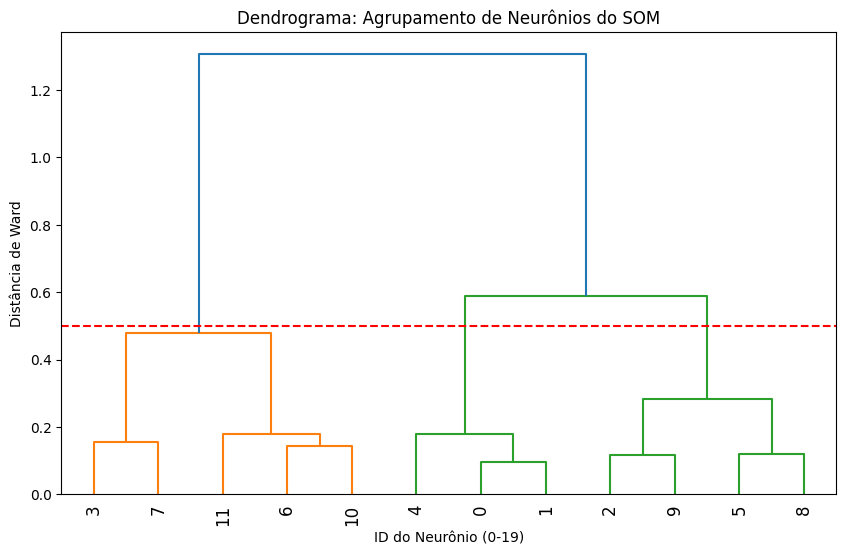

super_cluster
0    527
1    512
3    388
4    340
2    294
5    186
Name: count, dtype: int64


In [40]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

# 1. Extrair os pesos (codebook vectors) do SOM 4x5
# weights terá formato (20, n_features)
weights = som.get_weights().reshape(-1, data_to_som.shape[1])

# 2. Gerar a Linkage Matrix (usando o método de Ward para minimizar a variância)
Z = linkage(weights, method='ward')

# 3. Plotar o Dendrograma para decisão do "corte"
plt.figure(figsize=(10, 6))
dendrogram(Z, leaf_rotation=90., leaf_font_size=12.)
plt.title('Dendrograma: Agrupamento de Neurônios do SOM')
plt.xlabel('ID do Neurônio (0-19)')
plt.ylabel('Distância de Ward')
plt.axhline(y=0.5, color='r', linestyle='--') # Linha hipotética de corte
plt.show()

# 4. Executar o agrupamento final (exemplo: reduzindo para 5 Super-Clusters)
n_super_clusters = 6
hac = AgglomerativeClustering(n_clusters=n_super_clusters, linkage='ward')
super_labels = hac.fit_predict(weights)

# 5. Mapear os dias originais para os novos Super-Clusters
# Criamos um dicionário: ID_Neurônio -> ID_SuperCluster
mapping_dict = {i: label for i, label in enumerate(super_labels)}

# No seu dataframe original (daily_features), criamos a nova coluna
df_teste_gb['super_cluster'] = df_teste_gb['cluster_id'].map(mapping_dict)

print(df_teste_gb['super_cluster'].value_counts())

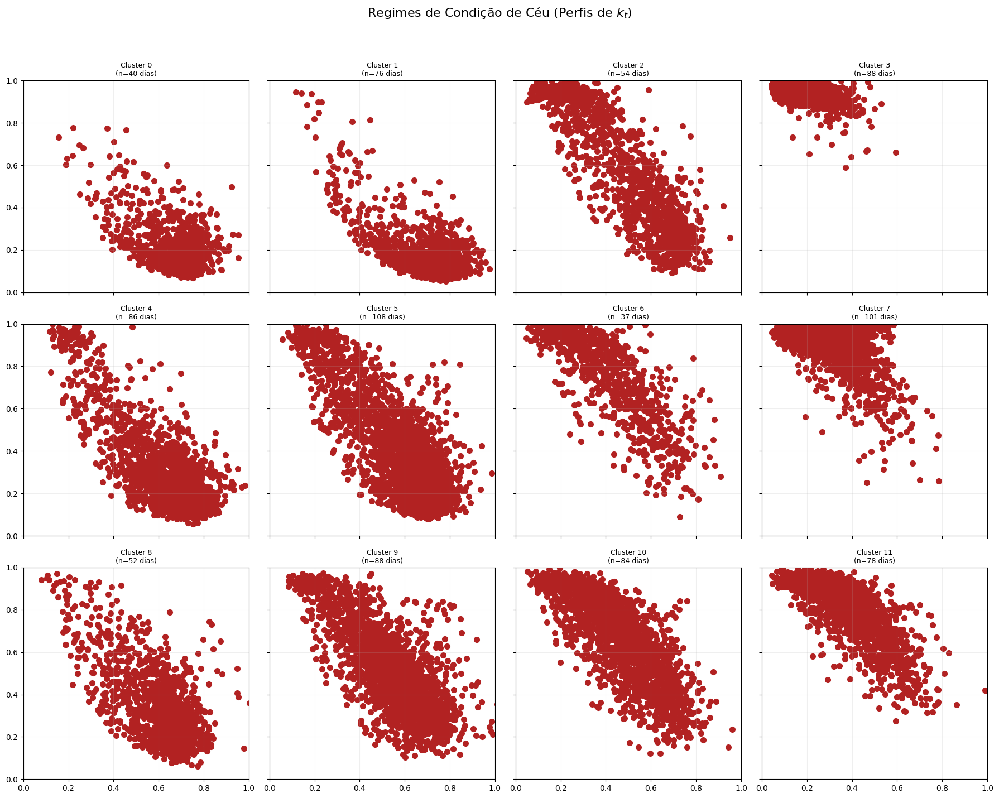

In [41]:
import matplotlib.pyplot as plt
import numpy as np

# 1. Associar os clusters ao dataframe de dados horários
# Certifique-se que o índice de 'df_horario' coincide com o de 'daily_features'
df_teste = df_processed.copy()
df_teste['data_only'] = df_teste.index.date

# 3. Fazemos o merge para trazer o cluster_id para cada hora
df_teste = pd.merge(df_teste, df_teste_gb[['cluster_id', 'super_cluster']], 
                              left_on='data_only', 
                              right_index=True, 
                              how='left')

fig, axes = plt.subplots(som_grid_x, som_grid_y, figsize=(18, 15), sharex=True, sharey=True)

for i in range(som_grid_x):
    for j in range(som_grid_y):
        # Localiza o ID do cluster (0 a 24)
        cluster_id = i * max(som_grid_y, som_grid_x) + j
        ax = axes[i, j]
        
        # Filtra os dados horários apenas dos dias pertencentes a este cluster
        dados_do_grupo = df_teste[(df_teste['cluster_id'] == cluster_id) & (df_teste['mask'] == 1)]
        
        if not dados_do_grupo.empty:
            # Plot da média
            ax.scatter(dados_do_grupo['kt'], dados_do_grupo['fracao_difusa'], color='firebrick', lw=2)
            
            ax.set_title(f'Cluster {cluster_id}\n(n={len(dados_do_grupo)//24} dias)', fontsize=9)
        else:
            ax.text(0.5, 0.5, 'Vazio', ha='center', va='center', alpha=0.5)

        # Configurações de eixo para kt
        ax.set_ylim(0, 1) 
        ax.set_xlim(0, 1)
        ax.grid(True, alpha=0.2)

plt.suptitle('Regimes de Condição de Céu (Perfis de $k_t$)', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

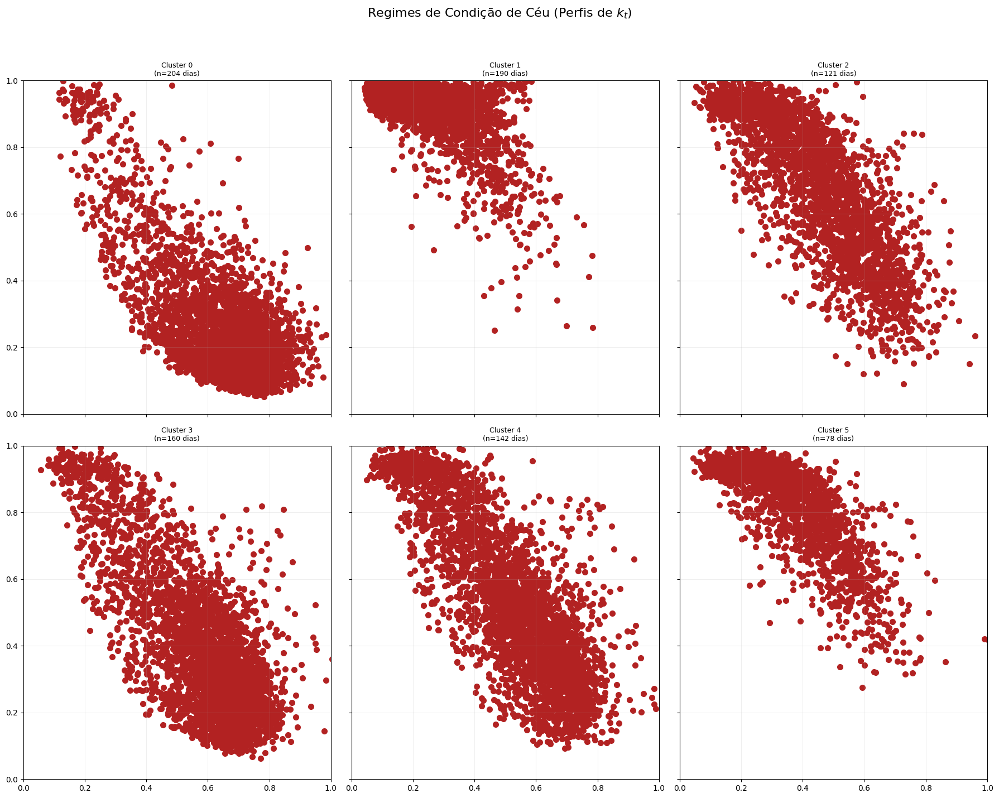

In [42]:
import matplotlib.pyplot as plt


fig, axes = plt.subplots(2, 3, figsize=(18, 15), sharex=True, sharey=True)

for i in range(2):
    for j in range(3):
        # Localiza o ID do cluster (0 a 24)
        cluster_id = i * 3 + j
        ax = axes[i, j]
        
        # Filtra os dados horários apenas dos dias pertencentes a este cluster
        dados_do_grupo = df_teste[(df_teste['super_cluster'] == cluster_id) & (df_teste['mask'] == 1)]
        
        if not dados_do_grupo.empty:
            # Plot da média
            ax.scatter(dados_do_grupo['kt'], dados_do_grupo['fracao_difusa'], color='firebrick', lw=2)
            
            ax.set_title(f'Cluster {cluster_id}\n(n={len(dados_do_grupo)//24} dias)', fontsize=9)
        else:
            ax.text(0.5, 0.5, 'Vazio', ha='center', va='center', alpha=0.5)

        # Configurações de eixo para kt
        ax.set_ylim(0, 1) 
        ax.set_xlim(0, 1)
        ax.grid(True, alpha=0.2)

plt.suptitle('Regimes de Condição de Céu (Perfis de $k_t$)', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

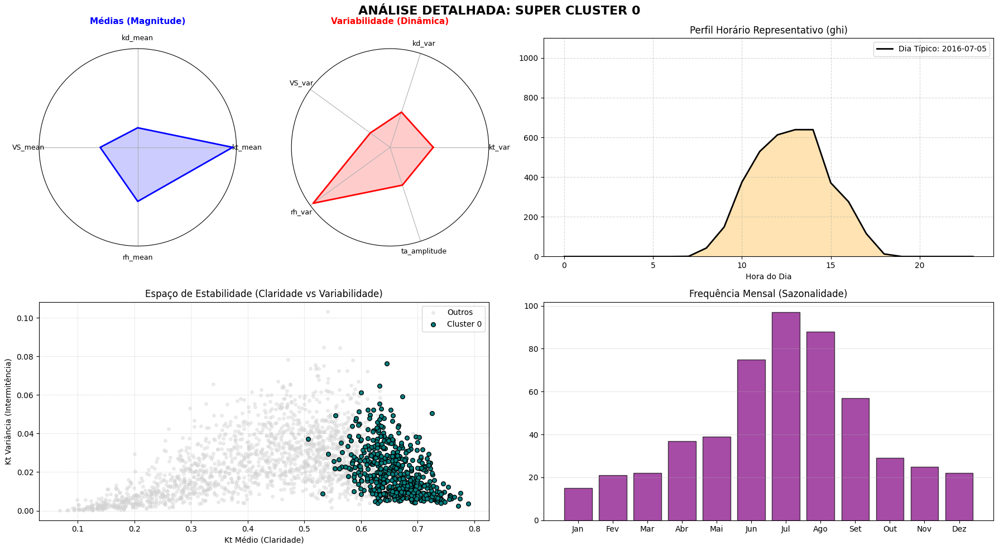

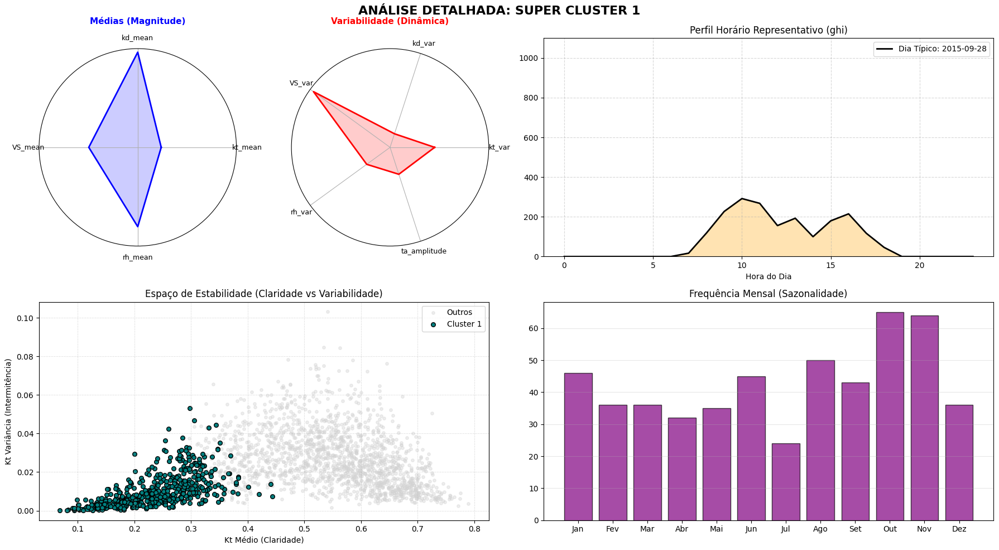

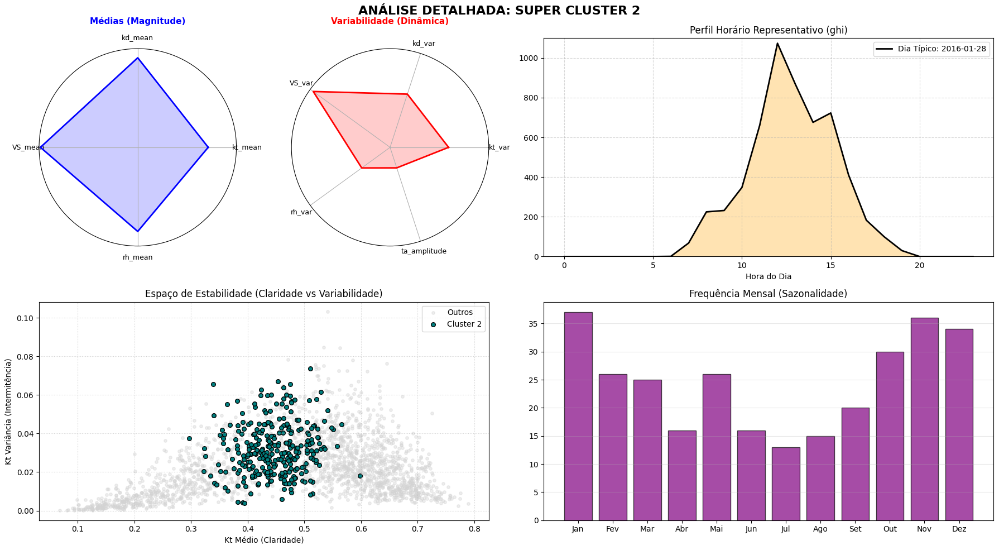

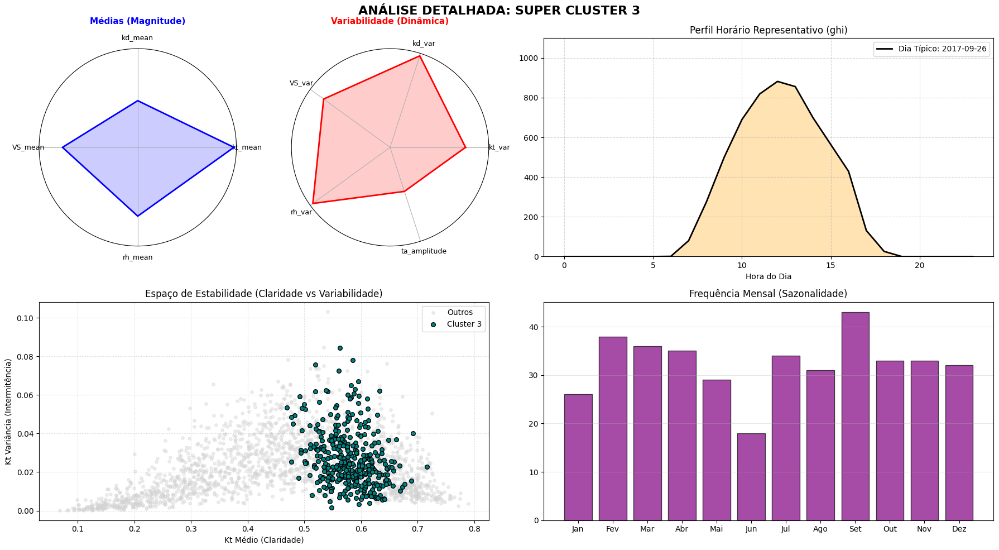

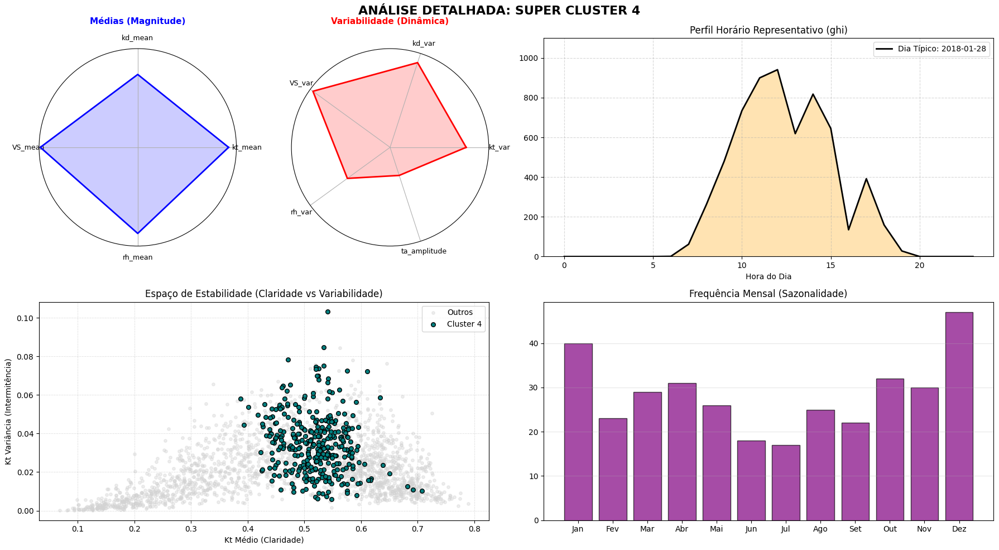

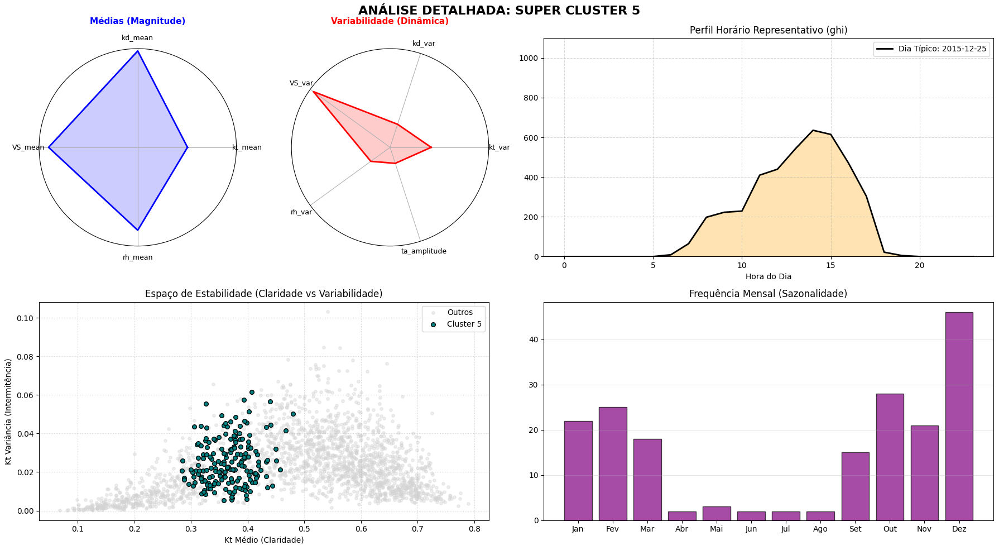

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from math import pi
from scipy.spatial import distance

def plotar_analise_cluster(df_diario, df_horario, coluna_irradiancia_horaria='GHI'):
    """
    Gera o framework de análise 'Cluster Passport' baseado no print enviado.
    
    Args:
        df_diario: Seu dataframe 'df_teste_gb' (Índice deve ser Datetime).
        df_horario: Dataframe com dados horários (deve ter índice Datetime).
        coluna_irradiancia_horaria: Nome da coluna no df_horario para plotar o perfil (ex: 'GHI', 'I_global', 'kt').
    """
    
    # 1. Definição Exata das Colunas do seu Print
    vars_medias = ['kt_mean', 'kd_mean', 'VS_mean', 'rh_mean'] #'aod_mean'
    vars_vars =   ['kt_var', 'kd_var', 'VS_var', 'rh_var', 'ta_amplitude']
    
    # Garantir que o índice é datetime
    if not isinstance(df_diario.index, pd.DatetimeIndex):
        df_diario.index = pd.to_datetime(df_diario.index)
    if not isinstance(df_horario.index, pd.DatetimeIndex):
        df_horario.index = pd.to_datetime(df_horario.index)

    # 2. Normalização (Min-Max) para o Radar Chart ficar bonito
    # (Isso não altera seus dados originais, cria uma cópia apenas para o gráfico)
    cols_to_norm = vars_medias + vars_vars
    df_norm = df_diario.copy()
    df_norm[cols_to_norm] = (df_diario[cols_to_norm] - df_diario[cols_to_norm].min()) / \
                            (df_diario[cols_to_norm].max() - df_diario[cols_to_norm].min())

    # Lista de Clusters Únicos
    clusters = sorted(df_diario['super_cluster'].unique())

    # 3. Loop para gerar um painel por Cluster
    for c in clusters:
        # Configuração do Grid (Layout)
        fig = plt.figure(figsize=(18, 10))
        gs = fig.add_gridspec(2, 4) # 2 linhas, 4 colunas
        fig.suptitle(f'ANÁLISE DETALHADA: SUPER CLUSTER {c}', fontsize=16, weight='bold', y=0.98)

        # --- A. RADAR CHART: ESTADO MÉDIO (Canto Superior Esquerdo) ---
        ax_radar1 = fig.add_subplot(gs[0, 0], polar=True)
        
        # Preparar dados do radar
        valores_med = df_norm[df_norm['super_cluster'] == c][vars_medias].mean().tolist()
        valores_med += valores_med[:1] # Fechar o ciclo
        angulos_med = [n / float(len(vars_medias)) * 2 * pi for n in range(len(vars_medias))]
        angulos_med += angulos_med[:1]
        
        ax_radar1.plot(angulos_med, valores_med, linewidth=2, linestyle='solid', color='blue')
        ax_radar1.fill(angulos_med, valores_med, 'blue', alpha=0.2)
        ax_radar1.set_xticks(angulos_med[:-1])
        ax_radar1.set_xticklabels(vars_medias, size=9)
        ax_radar1.set_title("Médias (Magnitude)", size=11, color='blue', weight='bold', y=1.1)
        ax_radar1.set_yticks([]) # Remove anéis concêntricos de valores para limpar

        # --- B. RADAR CHART: DINÂMICA/VARIÂNCIA (Canto Superior Centro-Esq) ---
        ax_radar2 = fig.add_subplot(gs[0, 1], polar=True)
        
        valores_var = df_norm[df_norm['super_cluster'] == c][vars_vars].mean().tolist()
        valores_var += valores_var[:1]
        angulos_var = [n / float(len(vars_vars)) * 2 * pi for n in range(len(vars_vars))]
        angulos_var += angulos_var[:1]
        
        ax_radar2.plot(angulos_var, valores_var, linewidth=2, linestyle='solid', color='red')
        ax_radar2.fill(angulos_var, valores_var, 'red', alpha=0.2)
        ax_radar2.set_xticks(angulos_var[:-1])
        ax_radar2.set_xticklabels(vars_vars, size=9)
        ax_radar2.set_title("Variabilidade (Dinâmica)", size=11, color='red', weight='bold', y=1.1)
        ax_radar2.set_yticks([])

        # --- C. PERFIL DIÁRIO REAL (Centróide) (Superior Direito - Ocupa 2 colunas) ---
        ax_perfil = fig.add_subplot(gs[0, 2:])
        
        # Encontrar o dia mais representativo (Centróide Euclidiano)
        sub_df = df_diario[df_diario['super_cluster'] == c]
        if not sub_df.empty:
            # Calcula o centro médio deste cluster
            centroide = sub_df[vars_medias + vars_vars].mean()
            # Acha o dia com menor distância para o centro
            distancias = sub_df[vars_medias + vars_vars].apply(lambda x: distance.euclidean(x, centroide), axis=1)
            dia_rep = distancias.idxmin() # Isso retorna o Timestamp do dia
            
            # Pega os dados horários desse dia específico
            try:
                dia_str = dia_rep.strftime('%Y-%m-%d')
                dados_dia_horario = df_horario.loc[dia_str]
                
                # Plot
                horas = dados_dia_horario.index.hour
                valores_h = dados_dia_horario[coluna_irradiancia_horaria]
                
                ax_perfil.plot(horas, valores_h, 'k-', linewidth=2, label=f'Dia Típico: {dia_str}')
                ax_perfil.fill_between(horas, valores_h, color='orange', alpha=0.3)
                ax_perfil.set_title(f"Perfil Horário Representativo ({coluna_irradiancia_horaria})")
                ax_perfil.set_xlabel("Hora do Dia")
                ax_perfil.set_ylim([0,1100])
                ax_perfil.grid(True, linestyle='--', alpha=0.5)
                ax_perfil.legend()
            except KeyError:
                ax_perfil.text(0.5, 0.5, "Dados horários não encontrados para este dia", ha='center')

        # --- D. SCATTER PLOT (Inferior Esquerdo - Ocupa 2 colunas) ---
        ax_scatter = fig.add_subplot(gs[1, 0:2])
        
        # Plot de fundo (todos os dados em cinza)
        ax_scatter.scatter(df_diario['kt_mean'], df_diario['kt_var'], c='lightgrey', alpha=0.4, s=15, label='Outros')
        # Plot do cluster (colorido)
        cluster_pts = df_diario[df_diario['super_cluster'] == c]
        ax_scatter.scatter(cluster_pts['kt_mean'], cluster_pts['kt_var'], c='teal', s=30, edgecolor='k', label=f'Cluster {c}')
        
        ax_scatter.set_xlabel('Kt Médio (Claridade)')
        ax_scatter.set_ylabel('Kt Variância (Intermitência)')
        ax_scatter.set_title("Espaço de Estabilidade (Claridade vs Variabilidade)")
        ax_scatter.legend()
        ax_scatter.grid(True, linestyle=':', alpha=0.6)

        # --- E. SAZONALIDADE (Inferior Direito - Ocupa 2 colunas) ---
        ax_hist = fig.add_subplot(gs[1, 2:])
        
        meses = cluster_pts.index.month
        ax_hist.hist(meses, bins=np.arange(1, 14)-0.5, rwidth=0.8, color='purple', alpha=0.7, edgecolor='black')
        ax_hist.set_xticks(range(1, 13))
        ax_hist.set_xticklabels(['Jan','Fev','Mar','Abr','Mai','Jun','Jul','Ago','Set','Out','Nov','Dez'])
        ax_hist.set_title("Frequência Mensal (Sazonalidade)")
        ax_hist.grid(axis='y', alpha=0.3)

        plt.tight_layout()
        plt.show()

# ==========================================
# COMO USAR COM SEUS DADOS:
# ==========================================
# df_teste_gb = pd.read_csv(...)  <-- Seu dataframe do print
# df_full_horario = pd.read_csv(...) <-- Seu dataframe com dados horários (GHI, etc)

# Basta chamar a função:
plotar_analise_cluster(df_teste_gb, df_teste, coluna_irradiancia_horaria='ghi')

<Axes: xlabel='kt_mean', ylabel='kt_var'>

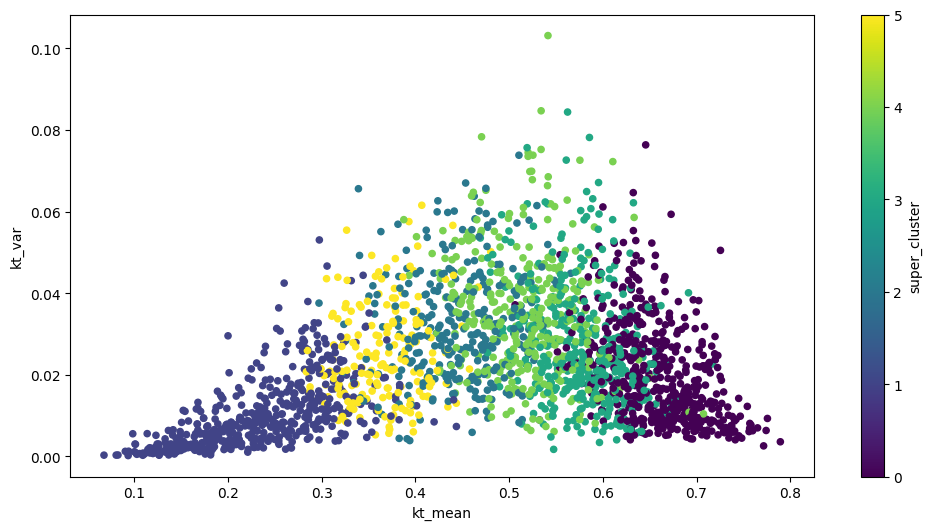

In [45]:
df_teste_gb.plot.scatter(x='kt_mean',
                        y='kt_var',
                        c = 'super_cluster',
                        colormap = 'viridis',
                        figsize = (12,6))



<Axes: xlabel='kt_mean', ylabel='kd_mean'>

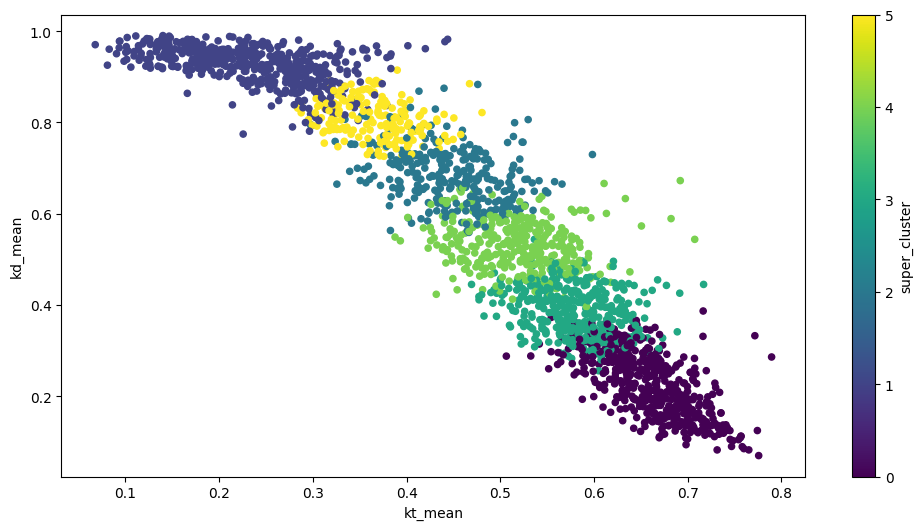

In [46]:
df_teste_gb.plot.scatter(x='kt_mean',
                        y='kd_mean',
                        c = 'super_cluster',
                        colormap = 'viridis',
                        figsize = (12,6))

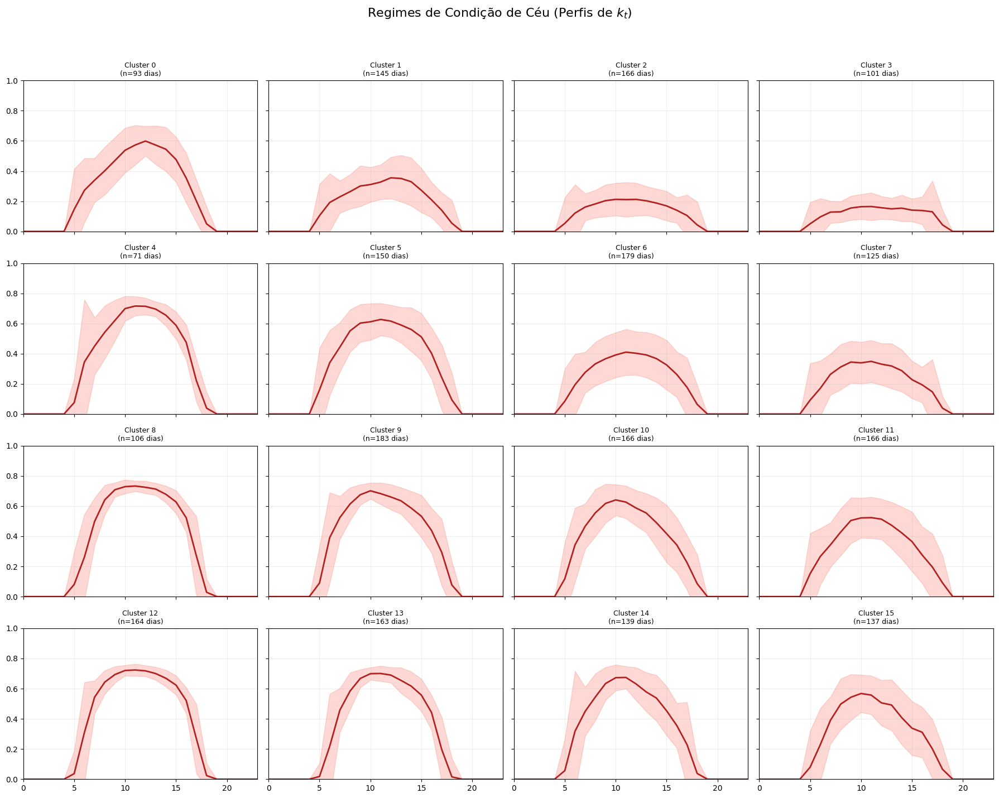

In [46]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(som_grid_x, som_grid_y, figsize=(18, 15), sharex=True, sharey=True)

for i in range(som_grid_x):
    for j in range(som_grid_y):
        # Localiza o ID do cluster (0 a 24)
        cluster_id = i * max(som_grid_x, som_grid_y) + j
        ax = axes[i, j]
        
        # Filtra os dados horários apenas dos dias pertencentes a este cluster
        dados_do_grupo = df_teste[df_teste['cluster_id'] == cluster_id]
        
        if not dados_do_grupo.empty:
            # Agrupa por hora para calcular média e desvio do kt
            stats = dados_do_grupo.groupby(dados_do_grupo.index.hour)['kt'].agg(['mean', 'std']).reset_index()
            
            # Plot da média
            ax.plot(stats['Date_Time'], stats['mean'], color='firebrick', lw=2)
            
            # Plot do desvio padrão (Sombreado)
            ax.fill_between(stats['Date_Time'], 
                            stats['mean'] - stats['std'], 
                            stats['mean'] + stats['std'], 
                            color='salmon', alpha=0.3)
            
            ax.set_title(f'Cluster {cluster_id}\n(n={len(dados_do_grupo)//24} dias)', fontsize=9)
        else:
            ax.text(0.5, 0.5, 'Vazio', ha='center', va='center', alpha=0.5)

        # Configurações de eixo para kt
        ax.set_ylim(0, 1) 
        ax.set_xlim(0, 23)
        ax.grid(True, alpha=0.2)

plt.suptitle('Regimes de Condição de Céu (Perfis de $k_t$)', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

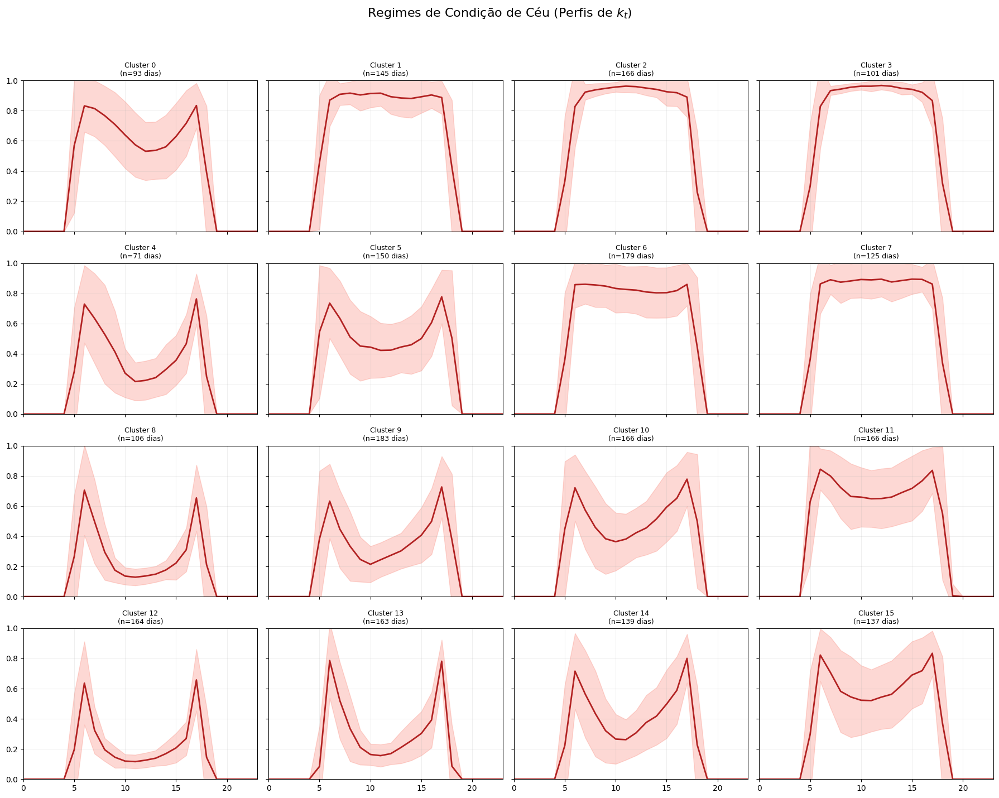

In [47]:
fig, axes = plt.subplots(som_grid_x, som_grid_y, figsize=(18, 15), sharex=True, sharey=True)

for i in range(som_grid_x):
    for j in range(som_grid_y):
        # Localiza o ID do cluster (0 a 24)
        cluster_id = i * max(som_grid_x, som_grid_y) + j
        ax = axes[i, j]
        
        # Filtra os dados horários apenas dos dias pertencentes a este cluster
        dados_do_grupo = df_teste[df_teste['cluster_id'] == cluster_id]
        
        if not dados_do_grupo.empty:
            # Agrupa por hora para calcular média e desvio do kt
            stats = dados_do_grupo.groupby(dados_do_grupo.index.hour)['fracao_difusa'].agg(['mean', 'std']).reset_index()
            
            # Plot da média
            ax.plot(stats['Date_Time'], stats['mean'], color='firebrick', lw=2)
            
            # Plot do desvio padrão (Sombreado)
            ax.fill_between(stats['Date_Time'], 
                            stats['mean'] - stats['std'], 
                            stats['mean'] + stats['std'], 
                            color='salmon', alpha=0.3)
            
            ax.set_title(f'Cluster {cluster_id}\n(n={len(dados_do_grupo)//24} dias)', fontsize=9)
        else:
            ax.text(0.5, 0.5, 'Vazio', ha='center', va='center', alpha=0.5)

        # Configurações de eixo para kt
        ax.set_ylim(0, 1) 
        ax.set_xlim(0, 23)
        ax.grid(True, alpha=0.2)

plt.suptitle('Regimes de Condição de Céu (Perfis de $k_t$)', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Solar

Grade      | QE         | TE         | Min Dias   | Max Dias  
------------------------------------------------------------
2x2        | 0.1076     | 0.0000     | 510        | 618       
2x3        | 0.0884     | 0.0000     | 291        | 472       
3x3        | 0.0769     | 0.1446     | 134        | 337       
3x4        | 0.0681     | 0.0441     | 116        | 280       
4x4        | 0.0621     | 0.1437     | 84         | 199       
4x5        | 0.0587     | 0.1629     | 64         | 171       
5x5        | 0.0543     | 0.2230     | 52         | 143       
5x6        | 0.0515     | 0.1317     | 28         | 139       
6x6        | 0.0491     | 0.1032     | 11         | 147       
6x7        | 0.0467     | 0.1162     | 15         | 125       
7x7        | 0.0445     | 0.1513     | 2          | 90        


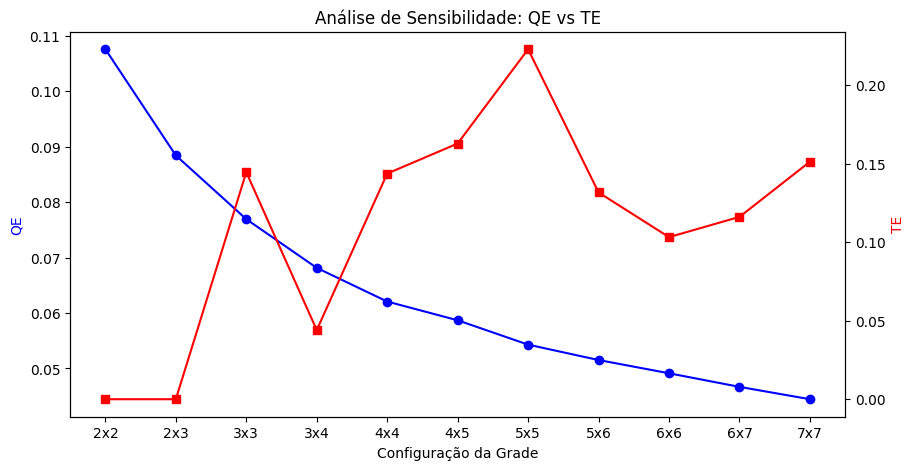

In [21]:
from minisom import MiniSom

#============================
#   --- Dados Kt, K, VS ---
#      (Quality Control)
#============================

df_teste_sol = df_processed.loc[(df_processed.index.year < 2022) & (df_processed['mask'] == 1)]

df_teste_sol_gb = df_teste_sol.groupby(df_teste_sol.index.date).agg({
    'kt': ['mean', 'var'],
    'fracao_difusa': ['mean', 'var'],
    'VS_cdfn':['mean', 'var'],
})
df_teste_sol_gb.columns = ['kt_mean', 'kt_var', 
                           'kd_mean', 'kd_var', 
                           'VS_mean', 'VS_var']

df_teste_sol_gb = df_teste_sol_gb.dropna() # Remover dias com falhas

#=============================
#   --- Junção dos Dados ---
#=============================
df_teste_gb = df_teste_sol_gb.copy()

data_to_som = df_teste_gb.values

import pandas as pd
import numpy as np
from minisom import MiniSom
import matplotlib.pyplot as plt

# Dimensões para testar
grids = [(2, 2), (2, 3), (3, 3), (3, 4), (4, 4), (4, 5), (5, 5), (5, 6), (6, 6), (6, 7), (7, 7)]
results = []

print(f"{'Grade':<10} | {'QE':<10} | {'TE':<10} | {'Min Dias':<10} | {'Max Dias':<10}")
print("-" * 60)

for x, y in grids:
    # Inicialização e Treino
    som = MiniSom(x, y, data_to_som.shape[1], sigma=1.0, learning_rate=0.5, random_seed=42)
    som.pca_weights_init(data_to_som)
    som.train_random(data_to_som, num_iteration=5000, verbose=False)
    
    # Cálculos
    qe = som.quantization_error(data_to_som)
    te = som.topographic_error(data_to_som)
    
    # Distribuição de Frequência
    winner_coordinates = np.array([som.winner(x) for x in data_to_som])
    cluster_ids = winner_coordinates[:, 0] * y + winner_coordinates[:, 1]
    counts = pd.Series(cluster_ids).value_counts()
    
    results.append({
        'grid': f'{x}x{y}',
        'qe': qe,
        'te': te,
        'counts': counts
    })
    
    print(f"{f'{x}x{y}':<10} | {qe:<10.4f} | {te:<10.4f} | {counts.min():<10} | {counts.max():<10}")

# Plot comparativo de QE e TE
fig, ax1 = plt.subplots(figsize=(10, 5))
nodes = [r['grid'] for r in results]
qes = [r['qe'] for r in results]
tes = [r['te'] for r in results]

ax1.plot(nodes, qes, 'b-o', label='Quantization Error (QE)')
ax1.set_xlabel('Configuração da Grade')
ax1.set_ylabel('QE', color='b')

ax2 = ax1.twinx()
ax2.plot(nodes, tes, 'r-s', label='Topographic Error (TE)')
ax2.set_ylabel('TE', color='r')

plt.title('Análise de Sensibilidade: QE vs TE')
plt.show()

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 0.06893029526566324
             kt_mean    kt_var   kd_mean    kd_var   VS_mean    VS_var  \
2015-06-13  0.685277  0.012047  0.142296  0.000842  0.070659  0.000850   
2015-06-14  0.605509  0.010481  0.224970  0.035110  0.107754  0.001706   
2015-06-16  0.379081  0.013876  0.837211  0.007547  0.225967  0.011936   
2015-06-17  0.439925  0.015305  0.874979  0.012392  0.227742  0.007688   
2015-06-18  0.561303  0.016125  0.380346  0.076054  0.176102  0.006230   

            cluster_id  
2015-06-13           3  
2015-06-14           2  
2015-06-16           1  
2015-06-17           1  
2015-06-18           6  


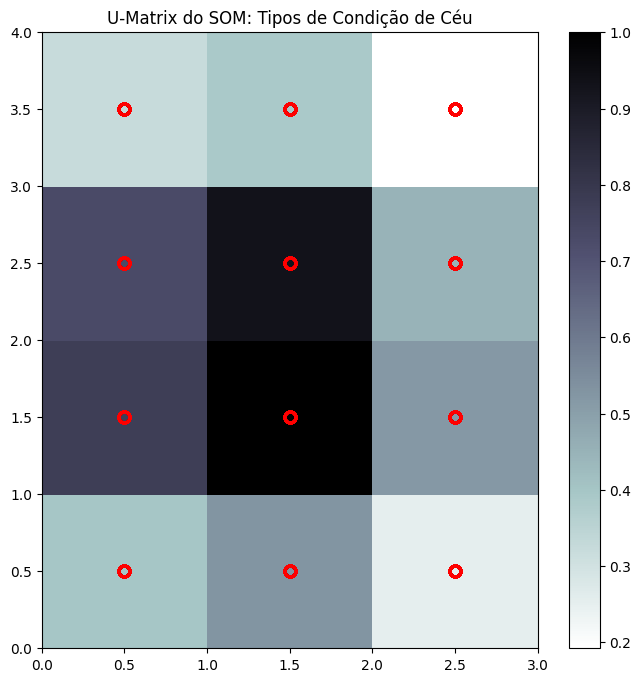

In [22]:
# Configurações do SOM
som_grid_x = 3
som_grid_y = 4
input_len = data_to_som.shape[1] # Deve ser 6

som = MiniSom(som_grid_x, som_grid_y, input_len, sigma=1.0, learning_rate=0.5)

# Inicialização dos pesos e treinamento
som.pca_weights_init(data_to_som)
som.train_random(data_to_som, num_iteration=5000, verbose=True)

# Função para mapear cada dia para um ID de cluster
def get_cluster_id(sample):
    w = som.winner(sample)
    return w[0] * som_grid_y + w[1]

# Criando a coluna de grupo
df_teste_gb['cluster_id'] = [get_cluster_id(x) for x in data_to_som]

print(df_teste_gb.head())

plt.figure(figsize=(8, 8))
plt.pcolor(som.distance_map().T, cmap='bone_r')  # Plot da distância entre neurônios
plt.colorbar()

# Adicionando marcadores para os dias
for i, x in enumerate(data_to_som):
    w = som.winner(x)
    plt.plot(w[0] + 0.5, w[1] + 0.5, 'o', markerfacecolor='None', 
             markeredgecolor='r', markersize=8, markeredgewidth=2)

plt.title('U-Matrix do SOM: Tipos de Condição de Céu')
plt.show()

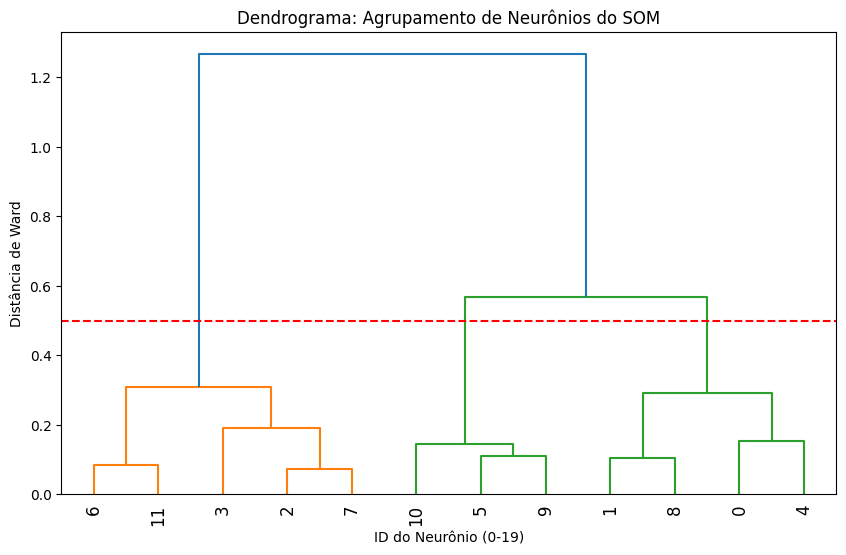

super_cluster
2    560
0    495
3    361
4    346
1    250
5    235
Name: count, dtype: int64


In [23]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

# 1. Extrair os pesos (codebook vectors) do SOM 4x5
# weights terá formato (20, n_features)
weights = som.get_weights().reshape(-1, data_to_som.shape[1])

# 2. Gerar a Linkage Matrix (usando o método de Ward para minimizar a variância)
Z = linkage(weights, method='ward')

# 3. Plotar o Dendrograma para decisão do "corte"
plt.figure(figsize=(10, 6))
dendrogram(Z, leaf_rotation=90., leaf_font_size=12.)
plt.title('Dendrograma: Agrupamento de Neurônios do SOM')
plt.xlabel('ID do Neurônio (0-19)')
plt.ylabel('Distância de Ward')
plt.axhline(y=0.5, color='r', linestyle='--') # Linha hipotética de corte
plt.show()

# 4. Executar o agrupamento final (exemplo: reduzindo para 5 Super-Clusters)
n_super_clusters = 6
hac = AgglomerativeClustering(n_clusters=n_super_clusters, linkage='ward')
super_labels = hac.fit_predict(weights)

# 5. Mapear os dias originais para os novos Super-Clusters
# Criamos um dicionário: ID_Neurônio -> ID_SuperCluster
mapping_dict = {i: label for i, label in enumerate(super_labels)}

# No seu dataframe original (daily_features), criamos a nova coluna
df_teste_gb['super_cluster'] = df_teste_gb['cluster_id'].map(mapping_dict)

print(df_teste_gb['super_cluster'].value_counts())

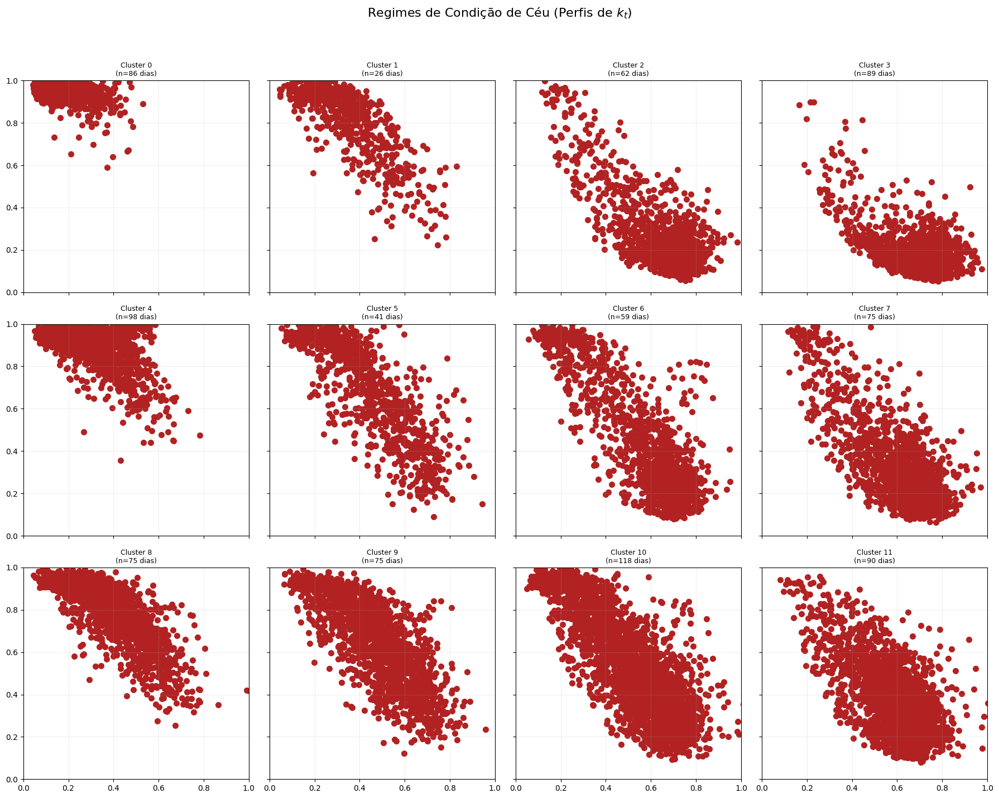

In [24]:
import matplotlib.pyplot as plt
import numpy as np

# 1. Associar os clusters ao dataframe de dados horários
# Certifique-se que o índice de 'df_horario' coincide com o de 'daily_features'
df_teste = df_processed.copy()
df_teste['data_only'] = df_teste.index.date

# 3. Fazemos o merge para trazer o cluster_id para cada hora
df_teste = pd.merge(df_teste, df_teste_gb[['cluster_id', 'super_cluster']], 
                              left_on='data_only', 
                              right_index=True, 
                              how='left')

fig, axes = plt.subplots(som_grid_x, som_grid_y, figsize=(18, 15), sharex=True, sharey=True)

for i in range(som_grid_x):
    for j in range(som_grid_y):
        # Localiza o ID do cluster (0 a 24)
        cluster_id = i * max(som_grid_y, som_grid_x) + j
        ax = axes[i, j]
        
        # Filtra os dados horários apenas dos dias pertencentes a este cluster
        dados_do_grupo = df_teste[(df_teste['cluster_id'] == cluster_id) & (df_teste['mask'] == 1)]
        
        if not dados_do_grupo.empty:
            # Plot da média
            ax.scatter(dados_do_grupo['kt'], dados_do_grupo['fracao_difusa'], color='firebrick', lw=2)
            
            ax.set_title(f'Cluster {cluster_id}\n(n={len(dados_do_grupo)//24} dias)', fontsize=9)
        else:
            ax.text(0.5, 0.5, 'Vazio', ha='center', va='center', alpha=0.5)

        # Configurações de eixo para kt
        ax.set_ylim(0, 1) 
        ax.set_xlim(0, 1)
        ax.grid(True, alpha=0.2)

plt.suptitle('Regimes de Condição de Céu (Perfis de $k_t$)', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

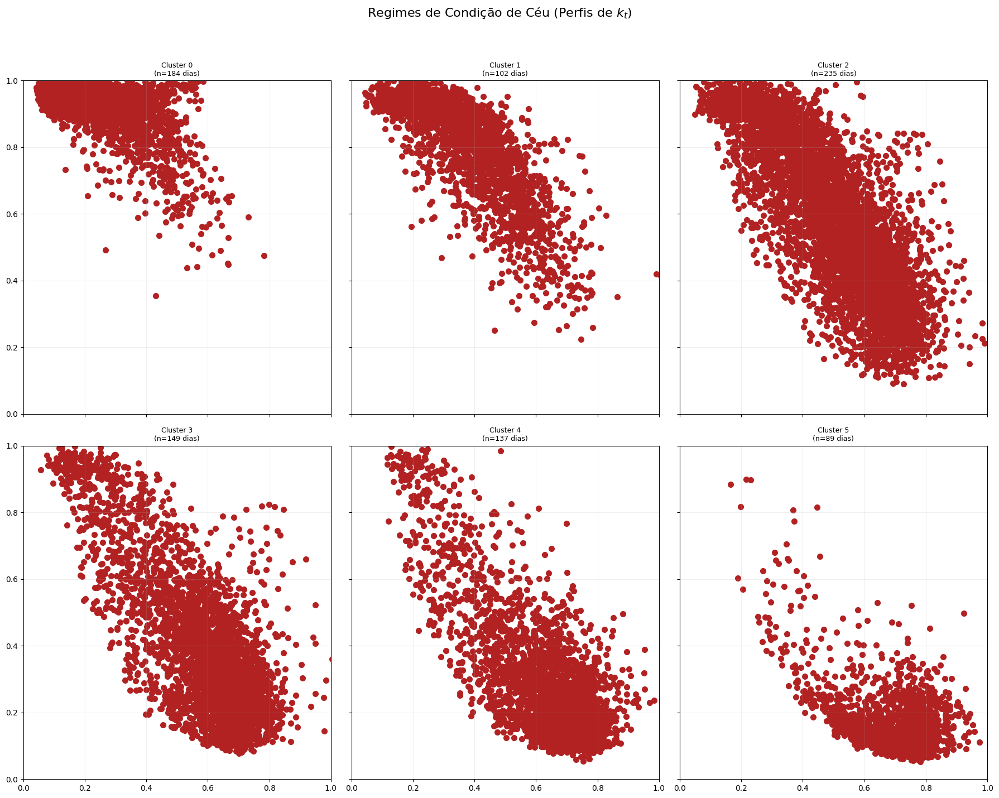

In [25]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(18, 15), sharex=True, sharey=True)

for i in range(2):
    for j in range(3):
        # Localiza o ID do cluster (0 a 24)
        cluster_id = i * 3 + j
        ax = axes[i, j]
        
        # Filtra os dados horários apenas dos dias pertencentes a este cluster
        dados_do_grupo = df_teste[(df_teste['super_cluster'] == cluster_id) & (df_teste['mask'] == 1)]
        
        if not dados_do_grupo.empty:
            # Plot da média
            ax.scatter(dados_do_grupo['kt'], dados_do_grupo['fracao_difusa'], color='firebrick', lw=2)
            
            ax.set_title(f'Cluster {cluster_id}\n(n={len(dados_do_grupo)//24} dias)', fontsize=9)
        else:
            ax.text(0.5, 0.5, 'Vazio', ha='center', va='center', alpha=0.5)

        # Configurações de eixo para kt
        ax.set_ylim(0, 1) 
        ax.set_xlim(0, 1)
        ax.grid(True, alpha=0.2)

plt.suptitle('Regimes de Condição de Céu (Perfis de $k_t$)', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

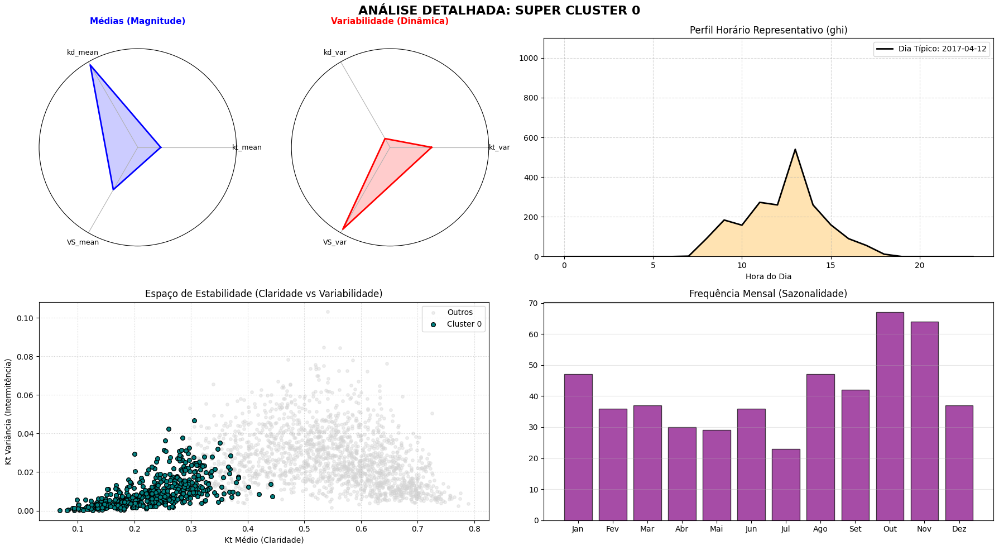

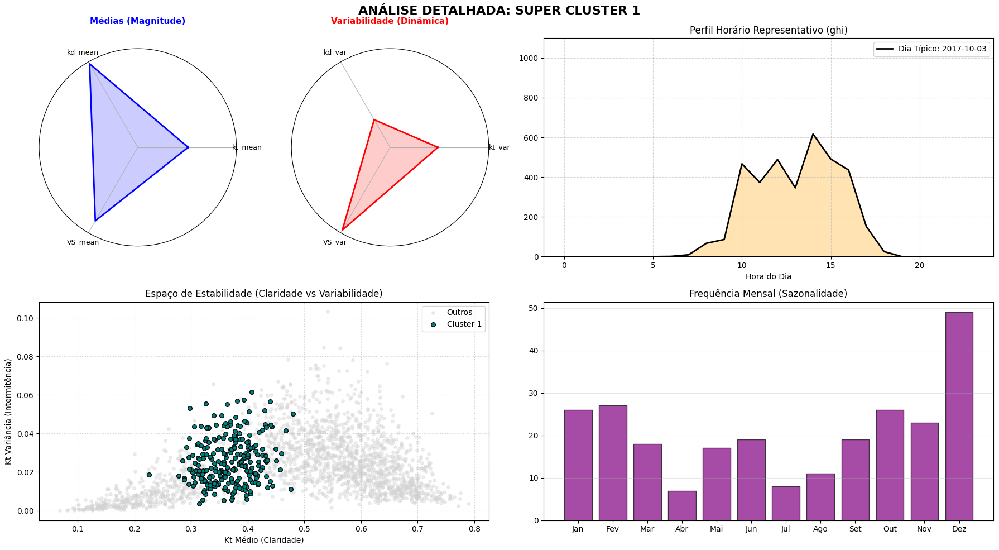

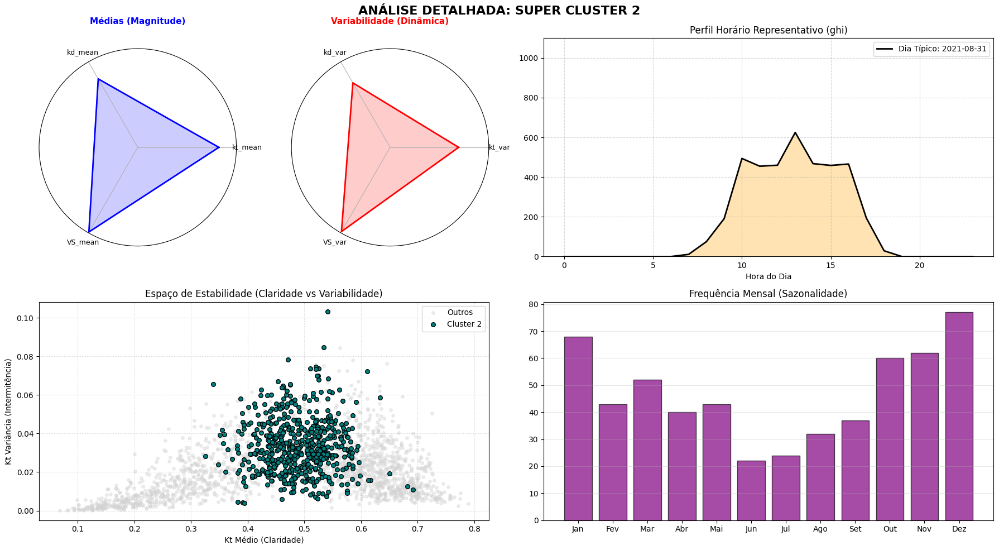

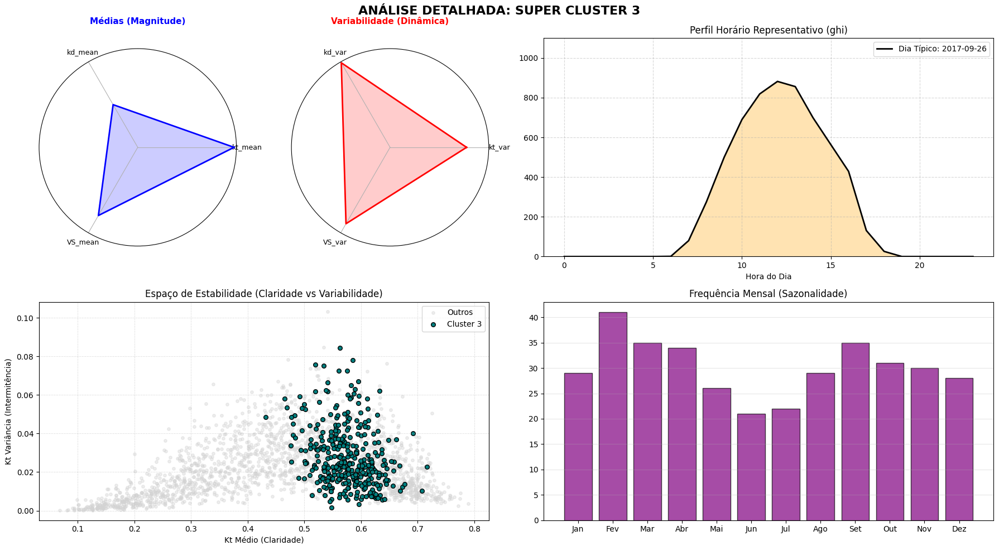

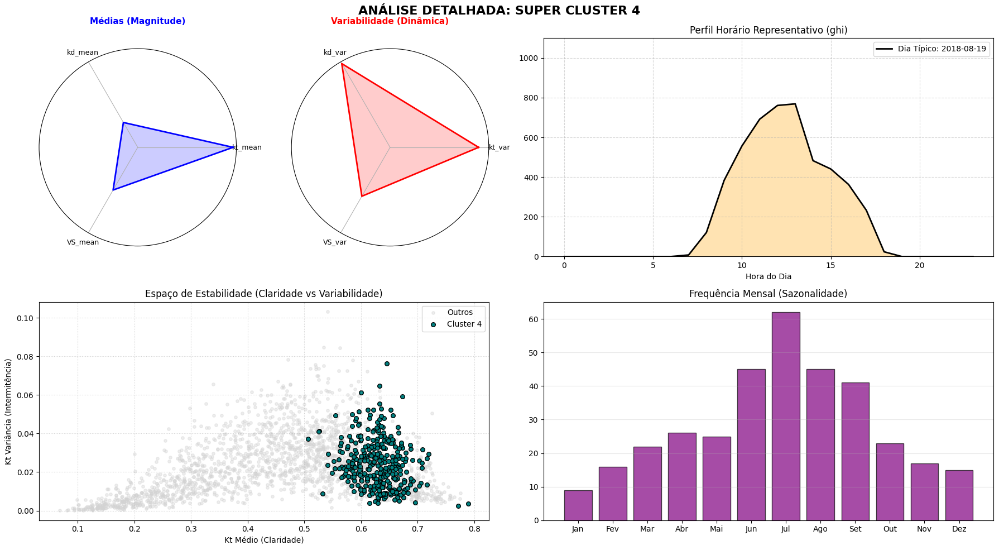

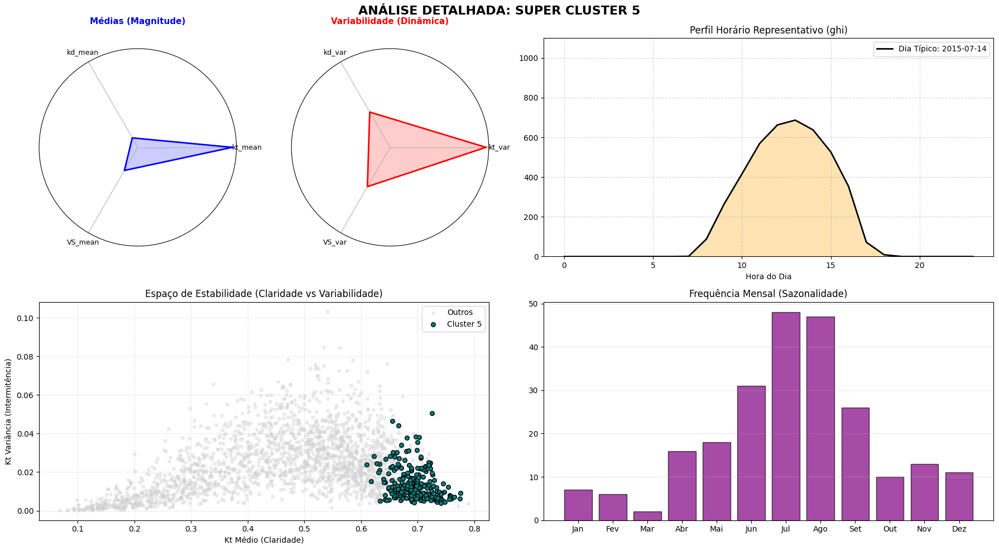

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from math import pi
from scipy.spatial import distance

def plotar_analise_cluster(df_diario, df_horario, coluna_irradiancia_horaria='GHI'):
    """
    Gera o framework de análise 'Cluster Passport' baseado no print enviado.
    
    Args:
        df_diario: Seu dataframe 'df_teste_gb' (Índice deve ser Datetime).
        df_horario: Dataframe com dados horários (deve ter índice Datetime).
        coluna_irradiancia_horaria: Nome da coluna no df_horario para plotar o perfil (ex: 'GHI', 'I_global', 'kt').
    """
    
    # 1. Definição Exata das Colunas do seu Print
    vars_medias = ['kt_mean', 'kd_mean', 'VS_mean'] #'aod_mean'
    vars_vars =   ['kt_var', 'kd_var', 'VS_var']
    
    # Garantir que o índice é datetime
    if not isinstance(df_diario.index, pd.DatetimeIndex):
        df_diario.index = pd.to_datetime(df_diario.index)
    if not isinstance(df_horario.index, pd.DatetimeIndex):
        df_horario.index = pd.to_datetime(df_horario.index)

    # 2. Normalização (Min-Max) para o Radar Chart ficar bonito
    # (Isso não altera seus dados originais, cria uma cópia apenas para o gráfico)
    cols_to_norm = vars_medias + vars_vars
    df_norm = df_diario.copy()
    df_norm[cols_to_norm] = (df_diario[cols_to_norm] - df_diario[cols_to_norm].min()) / \
                            (df_diario[cols_to_norm].max() - df_diario[cols_to_norm].min())

    # Lista de Clusters Únicos
    clusters = sorted(df_diario['super_cluster'].unique())

    # 3. Loop para gerar um painel por Cluster
    for c in clusters:
        # Configuração do Grid (Layout)
        fig = plt.figure(figsize=(18, 10))
        gs = fig.add_gridspec(2, 4) # 2 linhas, 4 colunas
        fig.suptitle(f'ANÁLISE DETALHADA: SUPER CLUSTER {c}', fontsize=16, weight='bold', y=0.98)

        # --- A. RADAR CHART: ESTADO MÉDIO (Canto Superior Esquerdo) ---
        ax_radar1 = fig.add_subplot(gs[0, 0], polar=True)
        
        # Preparar dados do radar
        valores_med = df_norm[df_norm['super_cluster'] == c][vars_medias].mean().tolist()
        valores_med += valores_med[:1] # Fechar o ciclo
        angulos_med = [n / float(len(vars_medias)) * 2 * pi for n in range(len(vars_medias))]
        angulos_med += angulos_med[:1]
        
        ax_radar1.plot(angulos_med, valores_med, linewidth=2, linestyle='solid', color='blue')
        ax_radar1.fill(angulos_med, valores_med, 'blue', alpha=0.2)
        ax_radar1.set_xticks(angulos_med[:-1])
        ax_radar1.set_xticklabels(vars_medias, size=9)
        ax_radar1.set_title("Médias (Magnitude)", size=11, color='blue', weight='bold', y=1.1)
        ax_radar1.set_yticks([]) # Remove anéis concêntricos de valores para limpar

        # --- B. RADAR CHART: DINÂMICA/VARIÂNCIA (Canto Superior Centro-Esq) ---
        ax_radar2 = fig.add_subplot(gs[0, 1], polar=True)
        
        valores_var = df_norm[df_norm['super_cluster'] == c][vars_vars].mean().tolist()
        valores_var += valores_var[:1]
        angulos_var = [n / float(len(vars_vars)) * 2 * pi for n in range(len(vars_vars))]
        angulos_var += angulos_var[:1]
        
        ax_radar2.plot(angulos_var, valores_var, linewidth=2, linestyle='solid', color='red')
        ax_radar2.fill(angulos_var, valores_var, 'red', alpha=0.2)
        ax_radar2.set_xticks(angulos_var[:-1])
        ax_radar2.set_xticklabels(vars_vars, size=9)
        ax_radar2.set_title("Variabilidade (Dinâmica)", size=11, color='red', weight='bold', y=1.1)
        ax_radar2.set_yticks([])

        # --- C. PERFIL DIÁRIO REAL (Centróide) (Superior Direito - Ocupa 2 colunas) ---
        ax_perfil = fig.add_subplot(gs[0, 2:])
        
        # Encontrar o dia mais representativo (Centróide Euclidiano)
        sub_df = df_diario[df_diario['super_cluster'] == c]
        if not sub_df.empty:
            # Calcula o centro médio deste cluster
            centroide = sub_df[vars_medias + vars_vars].mean()
            # Acha o dia com menor distância para o centro
            distancias = sub_df[vars_medias + vars_vars].apply(lambda x: distance.euclidean(x, centroide), axis=1)
            dia_rep = distancias.idxmin() # Isso retorna o Timestamp do dia
            
            # Pega os dados horários desse dia específico
            try:
                dia_str = dia_rep.strftime('%Y-%m-%d')
                dados_dia_horario = df_horario.loc[dia_str]
                
                # Plot
                horas = dados_dia_horario.index.hour
                valores_h = dados_dia_horario[coluna_irradiancia_horaria]
                
                ax_perfil.plot(horas, valores_h, 'k-', linewidth=2, label=f'Dia Típico: {dia_str}')
                ax_perfil.fill_between(horas, valores_h, color='orange', alpha=0.3)
                ax_perfil.set_title(f"Perfil Horário Representativo ({coluna_irradiancia_horaria})")
                ax_perfil.set_xlabel("Hora do Dia")
                ax_perfil.set_ylim([0,1100])
                ax_perfil.grid(True, linestyle='--', alpha=0.5)
                ax_perfil.legend()
            except KeyError:
                ax_perfil.text(0.5, 0.5, "Dados horários não encontrados para este dia", ha='center')

        # --- D. SCATTER PLOT (Inferior Esquerdo - Ocupa 2 colunas) ---
        ax_scatter = fig.add_subplot(gs[1, 0:2])
        
        # Plot de fundo (todos os dados em cinza)
        ax_scatter.scatter(df_diario['kt_mean'], df_diario['kt_var'], c='lightgrey', alpha=0.4, s=15, label='Outros')
        # Plot do cluster (colorido)
        cluster_pts = df_diario[df_diario['super_cluster'] == c]
        ax_scatter.scatter(cluster_pts['kt_mean'], cluster_pts['kt_var'], c='teal', s=30, edgecolor='k', label=f'Cluster {c}')
        
        ax_scatter.set_xlabel('Kt Médio (Claridade)')
        ax_scatter.set_ylabel('Kt Variância (Intermitência)')
        ax_scatter.set_title("Espaço de Estabilidade (Claridade vs Variabilidade)")
        ax_scatter.legend()
        ax_scatter.grid(True, linestyle=':', alpha=0.6)

        # --- E. SAZONALIDADE (Inferior Direito - Ocupa 2 colunas) ---
        ax_hist = fig.add_subplot(gs[1, 2:])
        
        meses = cluster_pts.index.month
        ax_hist.hist(meses, bins=np.arange(1, 14)-0.5, rwidth=0.8, color='purple', alpha=0.7, edgecolor='black')
        ax_hist.set_xticks(range(1, 13))
        ax_hist.set_xticklabels(['Jan','Fev','Mar','Abr','Mai','Jun','Jul','Ago','Set','Out','Nov','Dez'])
        ax_hist.set_title("Frequência Mensal (Sazonalidade)")
        ax_hist.grid(axis='y', alpha=0.3)

        plt.tight_layout()
        plt.show()

# ==========================================
# COMO USAR COM SEUS DADOS:
# ==========================================
# df_teste_gb = pd.read_csv(...)  <-- Seu dataframe do print
# df_full_horario = pd.read_csv(...) <-- Seu dataframe com dados horários (GHI, etc)

# Basta chamar a função:
plotar_analise_cluster(df_teste_gb, df_teste, coluna_irradiancia_horaria='ghi')

<Axes: xlabel='kt_mean', ylabel='kt_var'>

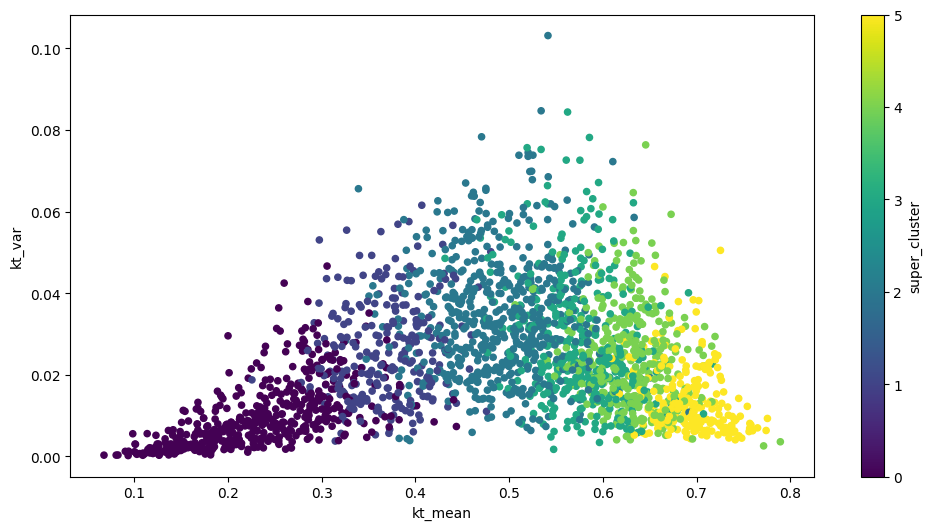

In [33]:
df_teste_gb.plot.scatter(x='kt_mean',
                        y='kt_var',
                        c = 'super_cluster',
                        colormap = 'viridis',
                        figsize = (12,6))

<Axes: xlabel='kt_mean', ylabel='kd_mean'>

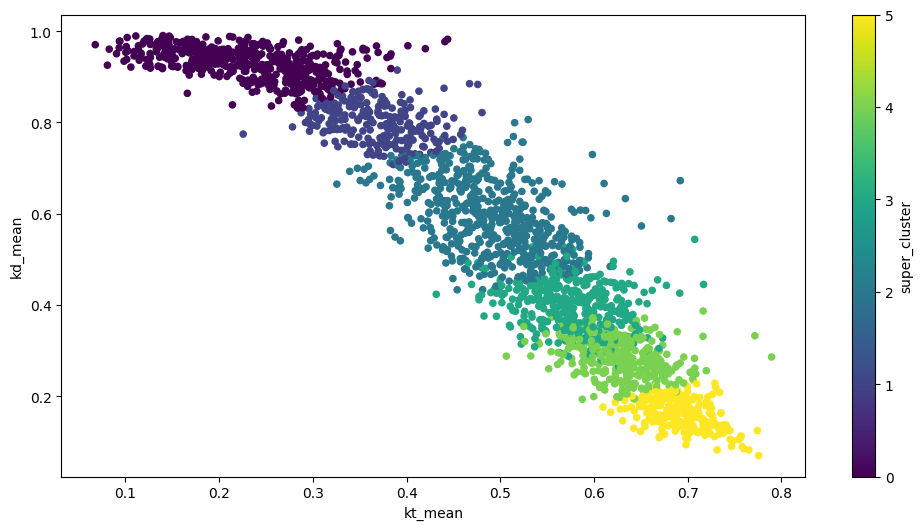

In [34]:
df_teste_gb.plot.scatter(x='kt_mean',
                        y='kd_mean',
                        c = 'super_cluster',
                        colormap = 'viridis',
                        figsize = (12,6))

## DTW-SOM

In [ ]:
x = pd.DataFrame(df_processed.index.date)
x = x.drop_duplicates().set_index(0)

val = list()
for i in x.index:
    y = df_processed.loc[df_processed.index.date == i]
    ideal = y['kt'].loc[(y['elevation']*90)>10]
    
    if len(ideal) == 0:
        continue
    
    real = y['kt'].loc[y['mask']==1]

    grupo = ideal.count()//3
    check_1 = (ideal[:grupo])
    check_2 = (ideal[grupo:grupo*2])
    check_3 = (ideal[grupo*2:])

    pct = 0.65

    if (check_1.count()*pct < real.loc[real.index.hour <= check_1.index.hour[-1]].count()) & (check_2.count()*pct < real.loc[(real.index.hour > check_1.index.hour[-1]) & (real.index.hour <= check_2.index.hour[-1])].count()) & (check_3.count()*pct <real.loc[real.index.hour > check_2.index.hour[-1]].count()):
        val.append(i)


x['class'] = x.index.isin(val)
x['class'] = np.where(x['class'] == True, 1, 0)
x.index = pd.to_datetime(x.index)

In [29]:
ideal

Date_Time
2022-12-31 07:00:00-03:00    0.276827
2022-12-31 08:00:00-03:00    0.534452
2022-12-31 09:00:00-03:00    0.620903
2022-12-31 10:00:00-03:00    0.680280
2022-12-31 11:00:00-03:00    0.633632
2022-12-31 12:00:00-03:00    0.395677
2022-12-31 13:00:00-03:00    0.526861
2022-12-31 14:00:00-03:00    0.347127
2022-12-31 15:00:00-03:00    0.091774
2022-12-31 16:00:00-03:00    0.191392
2022-12-31 17:00:00-03:00    0.486183
2022-12-31 18:00:00-03:00    0.274216
Name: kt, dtype: float64

In [28]:
y

,target,ghi,irrad_poa,temp_amb,humidity,wind_speed,Pressão Baromêtrica mm Hg,Pluviômetro mm,zenith,apparent_zenith,...,P_kt,P1,P2,P3,irr_clearsky_ratio,delta_kt,delta_fracao_difusa,VS_cdf,p,QS_n
Date_Time,,,,,,,,,,,,,,,,,,,,,
2022-12-31 00:00:00-03:00,0.000000,0.0,0.0,0.694881,0.8710,0.000000,700.46,0.0,133.276760,133.276760,...,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002000,-6327.030194,0.422649
2022-12-31 01:00:00-03:00,0.000000,0.0,0.0,0.695333,0.8560,0.004237,699.91,0.0,131.766984,131.766984,...,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002000,-6327.030194,0.422649
2022-12-31 02:00:00-03:00,0.000000,0.0,0.0,0.686857,0.8660,0.001412,699.61,0.0,126.202444,126.202444,...,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002000,-6327.030194,0.422649
2022-12-31 03:00:00-03:00,0.000000,0.0,0.0,0.681885,0.8760,0.000000,699.54,0.0,117.663124,117.663124,...,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002000,-6327.030194,0.422649
2022-12-31 04:00:00-03:00,0.000000,0.0,0.0,0.677704,0.8740,0.000000,699.73,0.0,107.193675,107.193675,...,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002000,-6327.030194,0.422649
2022-12-31 05:00:00-03:00,0.000000,0.0,0.0,0.665612,0.9230,0.000000,699.96,0.0,95.515588,95.515588,...,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002000,-6327.030194,0.422649
2022-12-31 06:00:00-03:00,0.001472,10.0,8.0,0.663352,0.9480,0.000000,700.45,0.0,83.073192,82.949282,...,-0.000000,0.000000,0.000000,0.000000,0.800000,0.058643,0.000000,0.005704,-1530.079811,0.254629
2022-12-31 07:00:00-03:00,0.045036,133.0,57.0,0.695107,0.8810,0.000000,701.06,0.0,70.135825,70.089986,...,0.058643,0.000874,0.000000,0.000000,0.428571,0.218184,-0.534357,0.042052,-102.218734,0.535731
2022-12-31 08:00:00-03:00,0.153168,413.0,231.0,0.720872,0.7460,0.000000,701.60,0.0,56.871081,56.845396,...,0.276827,0.003466,0.000874,0.000000,0.559322,0.257626,-0.138402,0.069765,-51.491870,0.702227


In [27]:
x

,class
0,
2015-06-11,0
2015-06-12,0
2015-06-13,0
2015-06-14,0
2015-06-15,0
...,...
2022-12-27,1
2022-12-28,0
2022-12-29,1


In [9]:
# Transformamos o resultado em um Index do pandas para usar o .isin()
datas_filtro = x.loc[x['class'] == 1].index.date
df_dtw = df_processed.loc[(df_processed.index.year < 2022)]
df_dtw = df_dtw.loc[pd.Index(df_dtw.index.date).isin(datas_filtro)]

In [20]:
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.utils import to_time_series_dataset

# 1. Estruturação dos Dados
features = ['kt', 'fracao_difusa', 'temp_amb', 'humidity', 'VS_cdfn']

# 2. Agrupamento por Dia e criação de lista de sequências
daily_sequences = []
valid_dates = []

for date, group in df_dtw.groupby(df_dtw.index.date):
    # Remove horas onde os dados solares são NaN (elevação < 10º)
    # Isso alinha os dados meteorológicos com a janela solar
    valid_hours = group.dropna(subset=['kt']) 
    
    # Regra de corte: Só aceita dias com pelo menos 6 horas de dados válidos
    if len(valid_hours) >= 6:
        # Pega apenas as features de interesse como um array (n_horas, n_features)
        seq = valid_hours[features].values
        daily_sequences.append(seq)
        valid_dates.append(date)

# 3. Formatação para o tslearn
# to_time_series_dataset preenche automaticamente as sequências mais curtas com NaN no final
# O tslearn sabe como ignorar esses NaNs ao calcular o DTW
X = to_time_series_dataset(daily_sequences)

# (Opcional) Padronizar cada série temporal individualmente para focar no "formato" da curva e não na amplitude
X = TimeSeriesScalerMeanVariance().fit_transform(X)

Calculando inércia para diferentes valores de K (isso pode demorar um pouco)...


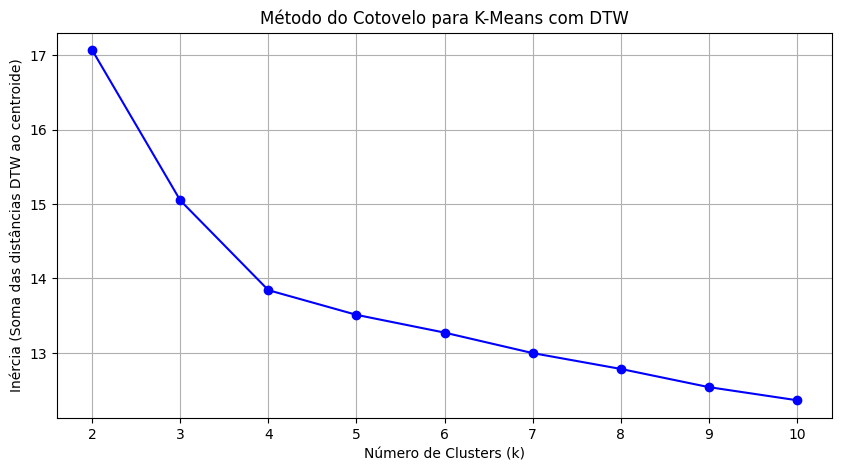

In [19]:
import matplotlib.pyplot as plt
from tslearn.clustering import TimeSeriesKMeans

# 1. Método do Cotovelo (Elbow Method) para achar o melhor K
# Equivalente a buscar a estabilização do Erro de Quantização (QE) no SOM
inertias = []
k_values = range(2, 11) # Testando de 2 a 10 clusters (ajuste conforme necessário)

print("Calculando inércia para diferentes valores de K (isso pode demorar um pouco)...")
for k in k_values:
    model_eval = TimeSeriesKMeans(n_clusters=k, 
                         metric="dtw", 
                         max_iter=5, 
                         #max_iter_barycenter=10,
                         random_state=42)
    model_eval.fit(X)
    inertias.append(model_eval.inertia_)

# Plotando a Curva do Cotovelo
plt.figure(figsize=(10, 5))
plt.plot(k_values, inertias, marker='o', linestyle='-', color='b')
plt.title('Método do Cotovelo para K-Means com DTW')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('Inércia (Soma das distâncias DTW ao centroide)')
plt.grid(True)
plt.show()

Calculando inércia para diferentes valores de K (isso pode demorar um pouco)...


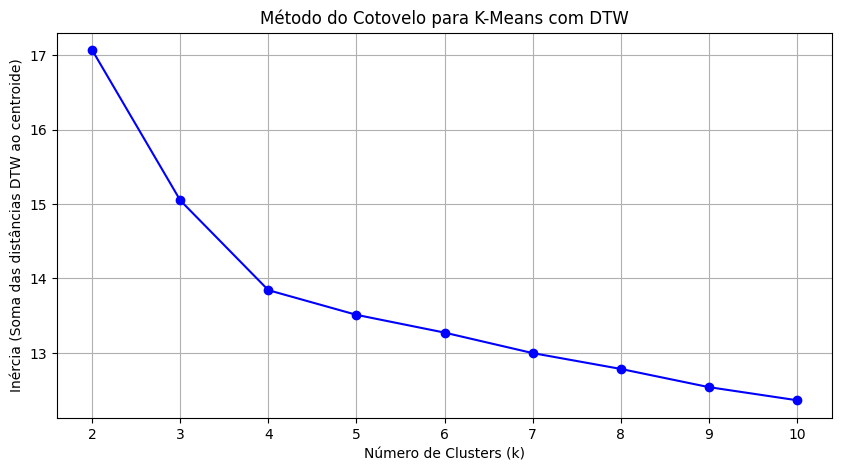

In [21]:
import matplotlib.pyplot as plt
from tslearn.clustering import TimeSeriesKMeans

# 1. Método do Cotovelo (Elbow Method) para achar o melhor K
# Equivalente a buscar a estabilização do Erro de Quantização (QE) no SOM
inertias = []
k_values = range(2, 11) # Testando de 2 a 10 clusters (ajuste conforme necessário)


print("Calculando inércia para diferentes valores de K (isso pode demorar um pouco)...")
for k in k_values:
    model_eval = TimeSeriesKMeans(n_clusters=k, 
                         metric="dtw", 
                         max_iter=5, 
                         #max_iter_barycenter=10,
                         random_state=42)
    model_eval.fit(X)
    inertias.append(model_eval.inertia_)

# Plotando a Curva do Cotovelo
plt.figure(figsize=(10, 5))
plt.plot(k_values, inertias, marker='o', linestyle='-', color='b')
plt.title('Método do Cotovelo para K-Means com DTW')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('Inércia (Soma das distâncias DTW ao centroide)')
plt.grid(True)
plt.show()


Treinando modelo final com K=10 para visualização...


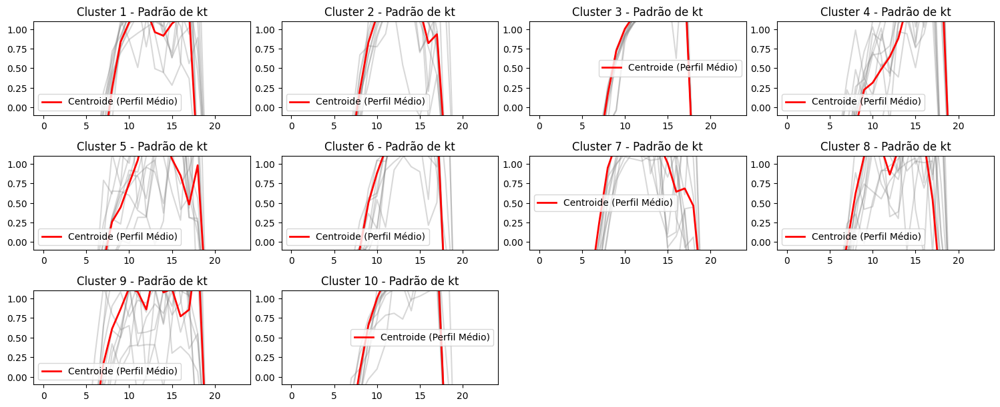

In [26]:
# -----------------------------------------------------------------------------
# 2. Visualização dos Centroides (Perfis Diários de cada Cluster)
# Escolha o melhor 'k' baseado no gráfico acima. 
# Digamos que o gráfico mostrou um cotovelo em k=4 (exemplo)
best_k = 10

print(f"\nTreinando modelo final com K={best_k} para visualização...")
final_model = TimeSeriesKMeans(n_clusters=best_k, metric="dtw", max_iter=10, random_state=42)
labels = final_model.fit_predict(X)

# Plotando o formato médio (centroide) das features para cada cluster
# Vamos focar no k_t (índice de claridade) e var_solar, que são os mais visuais
feature_idx_kt = features.index('kt')

plt.figure(figsize=(15, 8))
for i in range(best_k):
    plt.subplot(4, 4, i + 1) # Ajuste o grid (2,2) dependendo do seu best_k
    
    # Plota algumas séries reais que caíram neste cluster para ver a dispersão (em cinza claro)
    for series in X[labels == i][:10]: # Mostrando apenas as 10 primeiras para não poluir
        plt.plot(series[:, feature_idx_kt], color="gray", alpha=0.3)
    
    # Plota o Centroide DBA (a curva média gerada pelo DTW) em vermelho
    plt.plot(final_model.cluster_centers_[i][:, feature_idx_kt], color="red", linewidth=2, label="Centroide (Perfil Médio)")
    
    plt.title(f'Cluster {i+1} - Padrão de kt')
    plt.ylim(-0.1, 1.1)
    plt.legend()

plt.tight_layout()
plt.show()

## Outros testes

Text(0.5, 36.72222222222221, 'Dia')

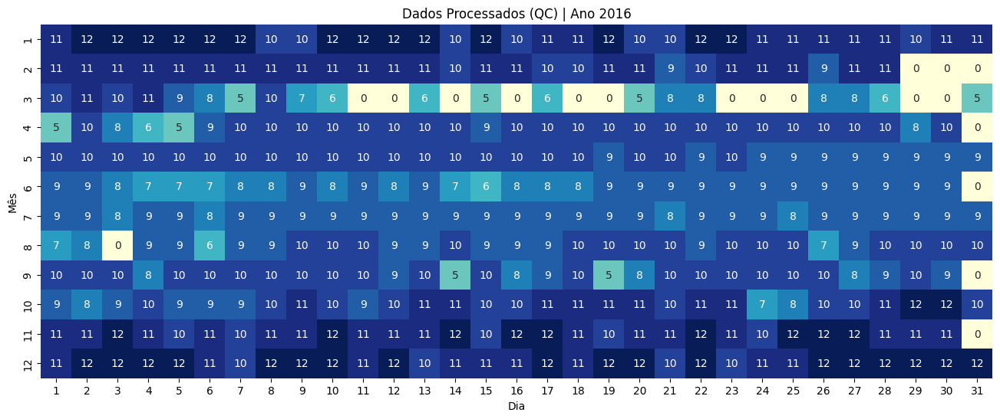

In [34]:
x = df2.loc[df2.index.year == 2018]
matriz2 = x.groupby([x.index.month, x.index.day]).size().unstack(fill_value=0)

fig, axes = plt.subplots(figsize=(16, 6))

# Plot 1
sns.heatmap(matriz2, annot=True, fmt="d", cmap="YlGnBu", ax=axes, cbar=False)
axes.set_title('Dados Processados (QC) | Ano 2016')
axes.set_ylabel('Mês')
axes.set_xlabel('Dia')

Text(0.5, 36.72222222222221, 'Dia')

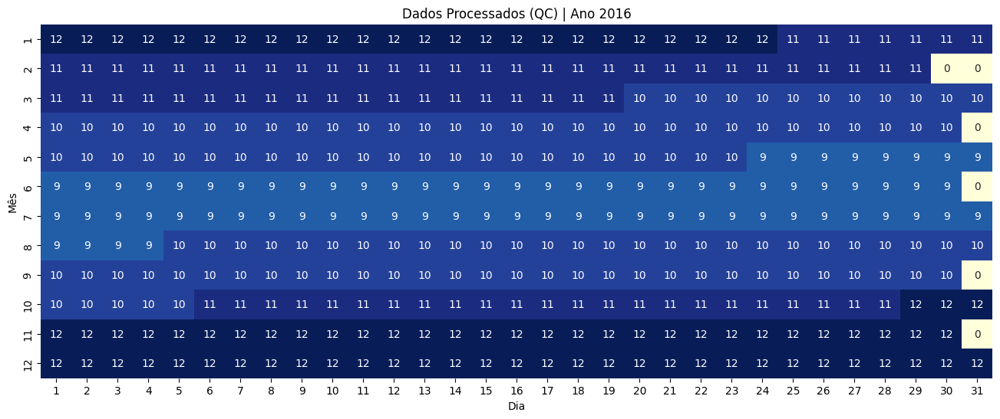

In [136]:
x = df1.loc[df1.index.year == 2016]
matriz1 = x.groupby([x.index.month, x.index.day]).size().unstack(fill_value=0)

fig, axes = plt.subplots(figsize=(16, 6))

# Plot 1
sns.heatmap(matriz1, annot=True, fmt="d", cmap="YlGnBu", ax=axes, cbar=False)
axes.set_title('Dados Processados (QC) | Ano 2016')
axes.set_ylabel('Mês')
axes.set_xlabel('Dia')

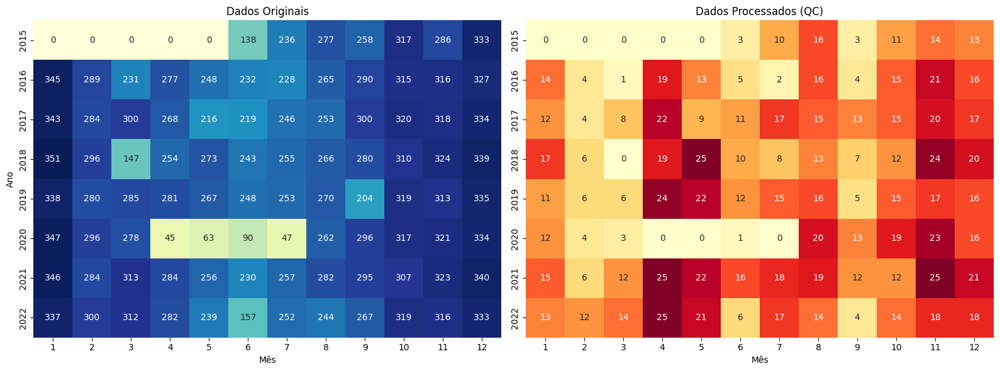

In [14]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


# Criando dois dataframes diferentes
#df1 = df[['Irradiação Global horária(horizontal) kWh/m2']].loc[df['Irradiação Global horária(horizontal) kWh/m2'] != 0]
df2 = df_processed[['kt']].loc[df_processed['mask'] == 1]
#df1 = df_processed[['ghi']].loc[df_processed['elevation']*90 > 10]

# --- 2. Função de Processamento ---
def preparar_matriz_contagem(df):
    # fill_value=0 garante que meses sem dados apareçam como 0
    matriz = df.groupby([df.index.year, df.index.month]).size().unstack(fill_value=0)
    
    return matriz

# Processando os dois dataframes
# IMPORTANTE: Mude 'data_registro' para o nome da sua coluna de data real
matriz1 = preparar_matriz_contagem(df2.copy())
matriz2 = preparar_matriz_contagem(x.loc[x['class'] == 1].copy())

# --- 3. Plotando os Gráficos ---
# Criar uma figura com 1 linha e 2 colunas
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1
sns.heatmap(matriz1, annot=True, fmt="d", cmap="YlGnBu", ax=axes[0], cbar=False)
axes[0].set_title('Dados Originais')
axes[0].set_ylabel('Ano')
axes[0].set_xlabel('Mês')

# Plot 2
sns.heatmap(matriz2, annot=True, fmt="d", cmap="YlOrRd", ax=axes[1], cbar=False)
axes[1].set_title('Dados Processados (QC)')
axes[1].set_ylabel('') # Remove label Y para ficar mais limpo
axes[1].set_xlabel('Mês')

plt.tight_layout()
plt.show()

In [38]:
matriz1.where(matriz1 == matriz2, 1)

Date_Time,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
Date_Time,,,,,,,,,,,,,,,,,,,,,
1,1,12,12,12,12,12,12,1,1,12,...,12,12,11,11,11,11,11,1,11,11
2,11,11,11,11,11,11,11,11,11,11,...,1,11,11,11,1,11,11,0,0,0
3,1,11,1,11,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
4,1,10,1,1,1,1,10,10,10,10,...,10,10,10,10,10,10,10,1,10,0
5,10,10,10,10,10,10,10,10,10,10,...,1,10,9,9,9,9,9,9,9,9
6,9,9,1,1,1,1,1,1,9,1,...,9,9,9,9,9,9,9,9,9,0
7,9,9,1,9,9,1,9,9,9,9,...,9,9,9,1,9,9,9,9,9,9
8,1,1,1,9,9,1,1,1,10,10,...,1,10,10,10,1,1,10,10,10,10
9,10,10,10,1,10,10,10,10,10,10,...,10,10,10,10,10,1,1,10,1,0


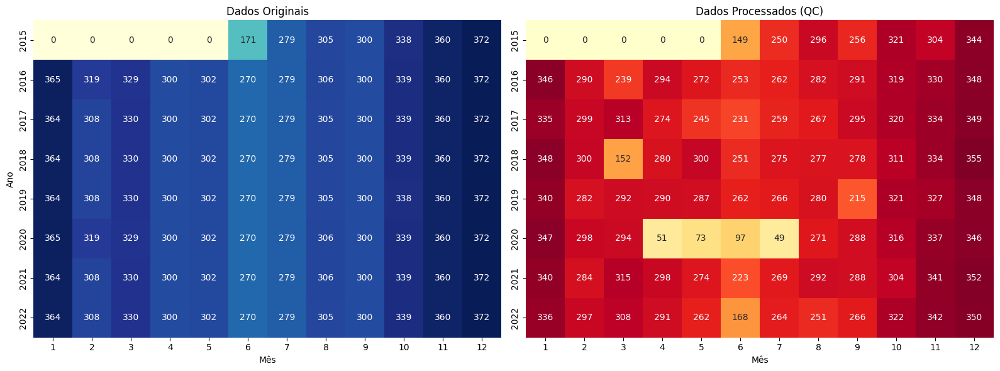

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


# Criando dois dataframes diferentes
#df1 = df[['Irradiação Global horária(horizontal) kWh/m2']].loc[df['Irradiação Global horária(horizontal) kWh/m2'] != 0]
df2 = df_processed[['kt']].loc[df_processed['mask'] == 1]
df1 = df_processed[['ghi']].loc[df_processed['elevation']*90 > 10]

# --- 2. Função de Processamento ---
def preparar_matriz_contagem(df):
    # fill_value=0 garante que meses sem dados apareçam como 0
    matriz = df.groupby([df.index.year, df.index.month]).size().unstack(fill_value=0)
    
    return matriz

# Processando os dois dataframes
# IMPORTANTE: Mude 'data_registro' para o nome da sua coluna de data real
matriz1 = preparar_matriz_contagem(df1.copy())
matriz2 = preparar_matriz_contagem(df2.copy())

# --- 3. Plotando os Gráficos ---
# Criar uma figura com 1 linha e 2 colunas
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1
sns.heatmap(matriz1, annot=True, fmt="d", cmap="YlGnBu", ax=axes[0], cbar=False)
axes[0].set_title('Dados Originais')
axes[0].set_ylabel('Ano')
axes[0].set_xlabel('Mês')

# Plot 2
sns.heatmap(matriz2, annot=True, fmt="d", cmap="YlOrRd", ax=axes[1], cbar=False)
axes[1].set_title('Dados Processados (QC)')
axes[1].set_ylabel('') # Remove label Y para ficar mais limpo
axes[1].set_xlabel('Mês')

plt.tight_layout()
plt.show()

## Treinamento

In [9]:
# 4. Validação de Colunas
target_col = CONFIG['target_col']

for col in target_col:
    if col not in df_processed.columns:
        raise ValueError(f"❌ Coluna alvo '{target_col}' não encontrada! Verifique o column_mapping.")

available_cols = [c for c in CONFIG['feature_cols'] if c in df_processed.columns]
if len(available_cols) != len(CONFIG['feature_cols']):
    print(f"⚠️ Features ajustadas: {available_cols}")
    CONFIG['feature_cols'] = available_cols

# 5. Split Temporal (Último Ano = Teste)
#last_year = df_processed.index.year.max() <---- REMOVER FUTURAMENTE
last_year = CONFIG['test_year']
print(f"📅 Separando ano {last_year} para TESTE.")

test_df = df_processed[df_processed.index.year == last_year].copy()
dev_df = df_processed[df_processed.index.year < last_year].copy()

if dev_df.empty:
    raise ValueError("❌ Erro no Split: Dados insuficientes antes do último ano.")

# Split Treino/Validação
n_dev = len(dev_df)
train_end = int(n_dev * CONFIG['split_ratios']['train'])

train_df = dev_df.iloc[:train_end].copy()
val_df = dev_df.iloc[train_end:].copy()

print(f"📊 Divisão: Treino={len(train_df)} | Val={len(val_df)} | Teste={len(test_df)}")


# DataLoaders
train_dataset = SolarEfficientDataset(
    df=train_df, 
    feature_cols=CONFIG['feature_cols'], 
    target_col=CONFIG['target_col'],
    aux_col=CONFIG['aux_col'],
    n_past=CONFIG['input_seq_len'], 
    n_future=CONFIG['output_seq_len']
)
val_dataset = SolarEfficientDataset(
    df=val_df, 
    feature_cols=CONFIG['feature_cols'], 
    target_col=CONFIG['target_col'],
    aux_col=CONFIG['aux_col'],
    n_past=CONFIG['input_seq_len'], 
    n_future=CONFIG['output_seq_len']
)

train_loader = DataLoader(train_dataset, batch_size=CONFIG['batch_size'], shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=CONFIG['batch_size'], shuffle=False)

📅 Separando ano 2022 para TESTE.
📊 Divisão: Treino=45986 | Val=11497 | Teste=8759
✅ Dataset pronto. Amostras válidas: 16525
✅ Dataset pronto. Amostras válidas: 4651


In [13]:
# 6. Modelo
model = EncDecModel(
    input_size=len(CONFIG['feature_cols']),
    hidden_sizes=CONFIG['hidden_sizes'],
    output_seq_len=CONFIG['output_seq_len'],
    output_dim=len(CONFIG['target_col']),
    cell_type=CONFIG['cell_type'],
    bidirectional=CONFIG['bidirectional'],
    use_attention=CONFIG['use_attention'],
    use_feature_attention=CONFIG['use_feature_attention'],
    dropout_prob=CONFIG['dropout']
).to(DEVICE)

# modificar o criterion muda a função de erro implementado a CPILoss
if CONFIG['loss_function'] == 'mse':
    criterion = MaskedMSELoss()
elif CONFIG['loss_function'] == 'cpi_loss':
    criterion = CPILoss()

optimizer = optim.Adam(model.parameters(), lr=CONFIG['learning_rate'])
early_stopping = EarlyStopping(patience=CONFIG['patience'], verbose=True, path=os.path.join(exp_dir, 'best_model.pt'))

# resumo do modelo
sample_input_size = (CONFIG['batch_size'], CONFIG['input_seq_len'], len(CONFIG['feature_cols']))
print("\n📊 Resumo do Modelo:")
display(summary(model, input_size=sample_input_size, device=DEVICE))

# 7. Treino
print("🔥 Iniciando épocas...")
train_losses, val_losses = [], []
start_time = time.time()


📊 Resumo do Modelo:


Layer (type:depth-idx)                   Output Shape              Param #
EncDecModel                              [32, 1, 2]                --
├─Encoder: 1-1                           [32, 24, 64]              --
│    └─ModuleList: 2-3                   --                        (recursive)
│    │    └─LSTM: 3-1                    [32, 24, 128]             69,632
│    └─Dropout: 2-2                      [32, 24, 128]             --
│    └─ModuleList: 2-3                   --                        (recursive)
│    │    └─LSTM: 3-2                    [32, 24, 64]              49,664
│    └─Dropout: 2-4                      [32, 24, 64]              --
├─Decoder: 1-2                           [32, 1, 2]                --
│    └─Dropout: 2-5                      [32, 1, 64]               --
│    └─ModuleList: 2-8                   --                        (recursive)
│    │    └─LSTM: 3-3                    [32, 1, 128]              99,328
│    └─Dropout: 2-7                      [32, 

🔥 Iniciando épocas...


In [ ]:
for epoch in range(CONFIG['epochs']):
    model.train()
    batch_losses = []
    for x, y, mask, aux in train_loader:
        x, y, mask, aux = x.to(DEVICE), y.to(DEVICE), mask.to(DEVICE), aux.to(DEVICE)
        optimizer.zero_grad()
        out = model(x)
        active_mask = mask if CONFIG['use_mask'] else None
        loss = criterion(out, y, mask=active_mask)
        loss.backward()
        optimizer.step()
        batch_losses.append(loss.item())
    
    avg_train = np.mean(batch_losses)
    train_losses.append(avg_train)

    model.eval()
    val_batch_losses = []
    with torch.no_grad():
        for x, y, mask, aux in val_loader:
            x, y, mask, aux = x.to(DEVICE), y.to(DEVICE), mask.to(DEVICE), aux.to(DEVICE)
            out = model(x)
            active_mask = mask if CONFIG['use_mask'] else None

            loss = criterion(out, y, aux_future=aux, mask=active_mask)
            
            val_batch_losses.append(loss.item())
    
    avg_val = np.mean(val_batch_losses)
    val_losses.append(avg_val)
    
    print(f"Epoch {epoch+1} | Train: {avg_train:.6f} | Val: {avg_val:.6f}")
    
    early_stopping(avg_val, model)
    if early_stopping.early_stop:
        print("🛑 Early stopping.")
        break


Epoch 1 | Train: 1.563508 | Val: 1.326667
Validation loss decreased (inf --> 1.326667).  Saving model ...
Epoch 2 | Train: 1.187680 | Val: 1.232297
Validation loss decreased (1.326667 --> 1.232297).  Saving model ...
Epoch 3 | Train: 1.125830 | Val: 1.207605
Validation loss decreased (1.232297 --> 1.207605).  Saving model ...
Epoch 4 | Train: 1.100791 | Val: 1.172352
Validation loss decreased (1.207605 --> 1.172352).  Saving model ...
Epoch 5 | Train: 1.094762 | Val: 1.172930
EarlyStopping counter: 1 out of 10
Epoch 6 | Train: 1.068347 | Val: 1.237300
EarlyStopping counter: 2 out of 10
Epoch 7 | Train: 1.063539 | Val: 1.162197
Validation loss decreased (1.172352 --> 1.162197).  Saving model ...
Epoch 8 | Train: 1.049404 | Val: 1.121395
Validation loss decreased (1.162197 --> 1.121395).  Saving model ...
Epoch 9 | Train: 1.034119 | Val: 1.164319
EarlyStopping counter: 1 out of 10
Epoch 10 | Train: 1.035586 | Val: 1.121188
Validation loss decreased (1.121395 --> 1.121188).  Saving model 

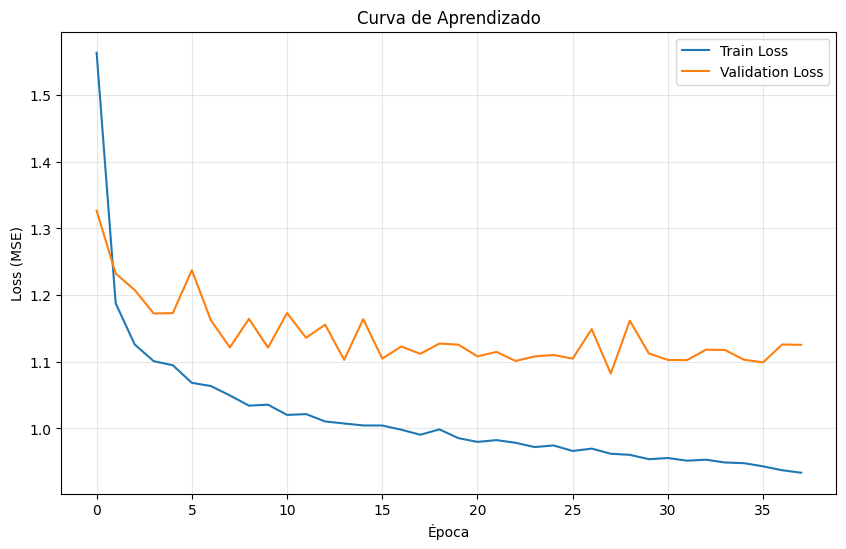

✅ Fim. Modelo salvo em: trained_models/2026-01-26_13-44-00_Teste_2


In [11]:
# SALVA A CURVA DE TREINAMENTO
def plot_learning_curve(train_losses, val_losses, save_path):
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Curva de Aprendizado')
    plt.xlabel('Época')
    plt.ylabel('Loss (MSE)')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    #plt.savefig(save_path)
    plt.close()

plot_learning_curve(train_losses, val_losses, os.path.join(exp_dir, 'learning_curve.png'))

pd.DataFrame({'epoch': range(1, len(train_losses)+1), 'train': train_losses, 'val': val_losses})\
    .to_csv(os.path.join(exp_dir, 'training_log.csv'), index=False)

final_metrics = {
    "best_val_loss": min(val_losses),
    "epochs": len(train_losses),
    "time_sec": time.time() - start_time,
    "model_path": os.path.join(exp_dir, 'best_model.pt'),
}


print(f"✅ Fim. Modelo salvo em: {exp_dir}")

In [4]:
#=============
#   Kasten
#=============
"""
dados_corrigidos = Kasten_Correction(df_processed)
df_processed['dhi_corrected_kasten'] = dados_corrigidos['dhi_corrected']
df_processed['fracao_difusa_kasten'] = df_processed['dhi_corrected_kasten'] / df_processed['ghi']
del(dados_corrigidos)
"""

#=============
#    BRL
#=============

pp = CONFIG['preprocessing']
lat = pp['latitude']  
lon = pp['longitude']  
tz = pp['timezone']  

betas = [-6.0424,8.5957, 0.0194, -0.0154, 1.6896, 0.5120]

df_resultado = BRL(df_processed, betas, lon, tz)
df_final = df_processed.join(df_resultado)

if df_final.index.tz is None:
    df_final.index = df_final.index.tz_localize('UTC').tz_convert(tz)
else:
    df_final.index = df_final.index.tz_convert(tz)

df_processed['fracao_difusa_brl'] = df_final['fracao_difusa_brl']
del(df_final)

In [12]:
df_processed[['QS', 'delta_kt', 'delta_fracao_difusa', 'cos_zenith', 'elevation', 'kt', 'fracao_difusa', 'mask']].iloc[500:524]

,QS,delta_kt,delta_fracao_difusa,cos_zenith,elevation,kt,fracao_difusa,mask
Date_Time,,,,,,,,
2015-07-02 13:30:00-03:00,0.108845,0.024020,-0.003760,0.637617,0.440160,0.222098,0.991556,1.0
2015-07-02 14:30:00-03:00,0.157828,0.062883,-0.039057,0.536782,0.360721,0.284981,0.952498,1.0
2015-07-02 15:30:00-03:00,0.138812,-0.049252,-0.004248,0.388719,0.254165,0.235728,0.948251,1.0
2015-07-02 16:30:00-03:00,0.067573,-0.116655,0.032978,0.203516,0.130474,0.119073,0.981229,0.0
2015-07-02 17:30:00-03:00,0.209431,-0.119073,-0.481229,-0.006207,-0.003952,0.000000,0.500000,0.0
2015-07-02 18:30:00-03:00,0.000000,-0.000000,0.000000,-0.226161,-0.145235,-0.000000,0.000000,0.0
2015-07-02 19:30:00-03:00,0.000000,0.000000,0.000000,-0.441358,-0.291006,-0.000000,0.000000,0.0
2015-07-02 20:30:00-03:00,0.000000,0.000000,0.000000,-0.637135,-0.439761,-0.000000,0.000000,0.0
2015-07-02 21:30:00-03:00,0.000000,0.000000,0.000000,-0.800153,-0.590497,-0.000000,0.000000,0.0


In [13]:
df_processed[['QS', 'delta_kt', 'delta_fracao_difusa', 'cos_zenith', 'elevation', 'kt', 'fracao_difusa', 'mask']].head(24)

,QS,delta_kt,delta_fracao_difusa,cos_zenith,elevation,kt,fracao_difusa,mask
Date_Time,,,,,,,,
2015-06-11 17:30:00-03:00,0.000000,0.000000,0.000000,-0.022922,-0.014594,-0.000000,0.000000,0.0
2015-06-11 18:30:00-03:00,0.000000,0.000000,0.000000,-0.242917,-0.156208,-0.000000,0.000000,0.0
2015-06-11 19:30:00-03:00,0.000000,0.000000,0.000000,-0.457038,-0.302179,-0.000000,0.000000,0.0
2015-06-11 20:30:00-03:00,0.000000,0.000000,0.000000,-0.650699,-0.451048,-0.000000,0.000000,0.0
2015-06-11 21:30:00-03:00,0.000000,0.000000,0.000000,-0.810711,-0.601839,-0.000000,0.000000,0.0
2015-06-11 22:30:00-03:00,0.000000,0.000000,0.000000,-0.926177,-0.753850,-0.000000,0.000000,0.0
2015-06-11 23:30:00-03:00,0.000000,0.000000,0.000000,-0.989234,-0.906499,-0.000000,0.000000,0.0
2015-06-12 00:30:00-03:00,0.000000,0.000000,0.000000,-0.995590,-0.940193,-0.000000,0.000000,0.0
2015-06-12 01:30:00-03:00,0.000000,0.000000,0.000000,-0.944817,-0.787522,-0.000000,0.000000,0.0


0.5642485855044729


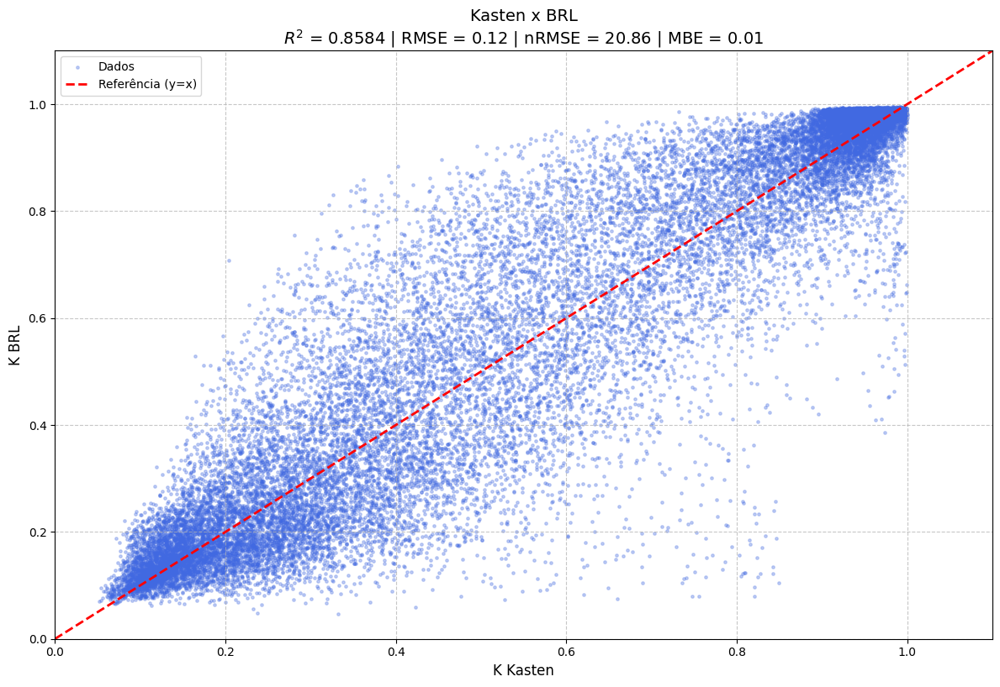

In [24]:
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# --- 1. Preparação dos Dados ---

# Filtro: Apenas Dias Claros E Período Diurno
mask_plot = (df_processed['is_clear_day']) & (df_processed['ghi'] > 10)
data_scatter = df_processed.loc[mask_plot]

# Definição das variáveis para o PLOT 1
#x1 = df_processed['dhi']       # Medido (Eixo X)
#y1 = df_processed['fracao_difusa_brl']* df_processed['ghi'] # Modelo 1 (Eixo Y)

x1 = df_processed['fracao_difusa']       # Medido (Eixo X)
y1 = df_processed['fracao_difusa_brl'] # Modelo 1 (Eixo Y)

# --- 2. Configuração da Figura com Subplots ---

# Cria uma figura com 1 linha e 2 colunas
# sharey=True faz com que ambos compartilhem a escala do eixo Y (bom para comparações)
fig, axes = plt.subplots(figsize=(12, 9), sharey=True)

# Define o limite máximo para os eixos (baseado no maior valor encontrado em todos os dados)
limit = max(x1.max(), y1.max(), y2.max()) + 50

# --- 3. Função Auxiliar para Plotagem (evita repetir código) ---

def plot_scatter(ax, x_data, y_data, title_prefix):
    # Calcular Métricas
    r2 = r2_score(x_data, y_data)
    rmse = np.sqrt(mean_squared_error(x_data, y_data))
    mbe = np.mean(y_data - x_data)

    mean_observed = np.mean(x_data)
    print(mean_observed)
    
    # Evita divisão por zero se a média for 0 (pouco provável em GHI diurno, mas boa prática)
    if mean_observed != 0:
        nrmse = (rmse / mean_observed) * 100
    else:
        nrmse = np.nan
    
    # Scatter dos pontos
    ax.scatter(x_data, y_data, alpha=0.3, s=6, color='royalblue', label='Dados')
    
    # Linha de Identidade (y=x)
    ax.plot([0, limit], [0, limit], color='red', linestyle='--', linewidth=2, label='Referência (y=x)')
    
    # Configurações do gráfico individual
    ax.set_title(f'{title_prefix}\n$R^2$ = {r2:.4f} | RMSE = {rmse:.2f} | nRMSE = {nrmse:.2f} | MBE = {mbe:.2f}', fontsize=14)
    ax.set_xlabel('K Kasten', fontsize=12)
    ax.grid(True, which='both', linestyle='--', alpha=0.7)
    ax.set_xlim(0, 1.1)
    ax.set_ylim(0, 1.1)
    ax.legend()

# --- 4. Gerar os Gráficos ---

# Plot 1 (Esquerda) -> Acessamos via axes[0]
plot_scatter(axes, x1, y1, "Kasten x BRL")
axes.set_ylabel('K BRL', fontsize=12) # Rótulo Y apenas no primeiro

# Plot 2 (Direita) -> Acessamos via axes[1]
#plot_scatter(axes[1], x2, y2, "Modelo 2: ESRA DeepSeek Optimized")

# Título Geral da Figura (Opcional)
#plt.suptitle('Kasten x BRL', fontsize=16, y=0.95)

# Ajuste fino do layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Deixa espaço para o suptitle

# Salvar e Mostrar
# plt.savefig('validacao_comparativa.png', dpi=300)
plt.show()

In [53]:
d=df_processed.drop(columns=['dhi', 'dni'])
d['dhi'] = d['fracao_difusa_kasten'] * d['ghi']
d['dni'] = (d['ghi'] - d['dhi'])/d['cos_zenith']

In [54]:
preprocessor = SolarPreprocessor(
    latitude=pp_conf['latitude'], 
    longitude=pp_conf['longitude'], 
    altitude=pp_conf['altitude'],
    timezone=pp_conf['timezone'], 
    nominal_power=pp_conf['nominal_power'], 
    start_year=pp_conf['start_year'],
    cs_model = 'esra',
    features_to_scale=pp_conf['features_to_scale'],
    target_col=CONFIG['target_col'], # <--- unica variavel que não vem do preprocessing
    column_mapping=pp_conf['column_mapping'] 
)


preprocessor.fit(d)
preprocessor.save_scalers(exp_dir)
preprocessor.save_scalers(ARTIFACTS_DIR)

# O método transform usa o column_mapping para renomear as colunas
df_processed_2 = preprocessor.transform(d)

🌡️  U0=23.50, U1=6.25
💾 Scalers salvos em: trained_models/2026-01-22_17-13-58_Teste_2
💾 Scalers salvos em: artifacts
Otimizando TL para 639 dias selecionados...
Otimização concluída. Média TL: 6.07


## Analise Gráfica

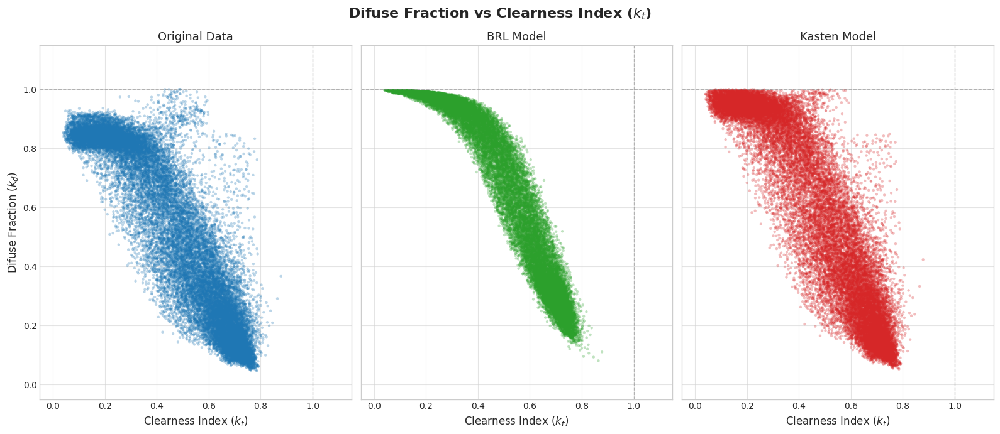

In [55]:
import matplotlib.pyplot as plt
import numpy as np

x = df_processed['kt']

# --- Configurações de Estilo (Opcional, mas ajuda) ---
# Tenta usar um estilo mais limpo se disponível, senão usa o padrão
try:
    plt.style.use('seaborn-v0_8-whitegrid')
except:
    plt.style.use('ggplot')

# Cria a figura e os eixos
fig, ax = plt.subplots(1, 3, figsize=(16, 7), sharey=True, sharex=True)

# Título Geral da Figura
fig.suptitle('Difuse Fraction vs Clearness Index ($k_t$)', 
             fontsize=16, y=0.98, fontweight='bold')

# --- Parâmetros visuais dos pontos ---
marker_style = {
    's': 10,           # Tamanho do ponto (menor é melhor para muitos dados)
    'alpha': 0.3,     # Transparência crucial para ver densidade
    'edgecolor': 'none' # Remove borda do ponto para suavizar
}

# =============================================================================
# PLOT 1: DADOS ANTIGOS (Esquerda)
# =============================================================================
# Usando uma cor fria (ex: azul 'tab:blue')
ax[0].scatter(x, 
              df_processed['fracao_difusa'], 
              color='tab:blue', label='Dados Originais', **marker_style)

ax[0].set_title("Original Data", fontsize=13)
ax[0].set_ylabel("Difuse Fraction ($k_d$)", fontsize=12) # Rótulo Y só no primeiro


# =============================================================================
# PLOT 2: NOVO BRL (Direita)
# =============================================================================
# Usando uma cor de destaque (ex: vermelho/laranja 'tab:red' ou verde 'tab:green')
# para diferenciar do gráfico anterior.
ax[1].scatter(x, 
              df_processed['fracao_difusa_brl'], 
              color='tab:green', label='Modelo BRL Calculado', **marker_style)

ax[1].set_title("BRL Model", fontsize=13)


ax[2].scatter(df_processed_2['kt'], 
              df_processed_2['fracao_difusa'], 
              color='tab:red', label='Modelo Kasten', **marker_style)

ax[2].set_title("Kasten Model", fontsize=13)

# =============================================================================
# CONFIGURAÇÕES COMUNS (Loop para aplicar a ambos)
# =============================================================================
for axis in ax:
    axis.set_xlabel("Clearness Index ($k_t$)", fontsize=12)
    
    # Grid mais suave
    axis.grid(True, which='major', linestyle='-', alpha=0.6, color='lightgray')
    
    # Linhas de referência física (Limites em 1.0)
    axis.axhline(1.0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
    axis.axvline(1.0, color='gray', linestyle='--', linewidth=1, alpha=0.5)

    # Limites dos eixos (Focando na área de interesse 0 a 1, com pequena margem)
    axis.set_xlim([-0.05, 1.15]) 
    axis.set_ylim([-0.05, 1.15])
    
    # Opcional: Adicionar legenda se quiser destacar o que são os pontos
    # axis.legend(loc='upper right', frameon=True)

# Ajusta o layout para não cortar títulos
plt.tight_layout()

# Mostra o gráfico
plt.show()

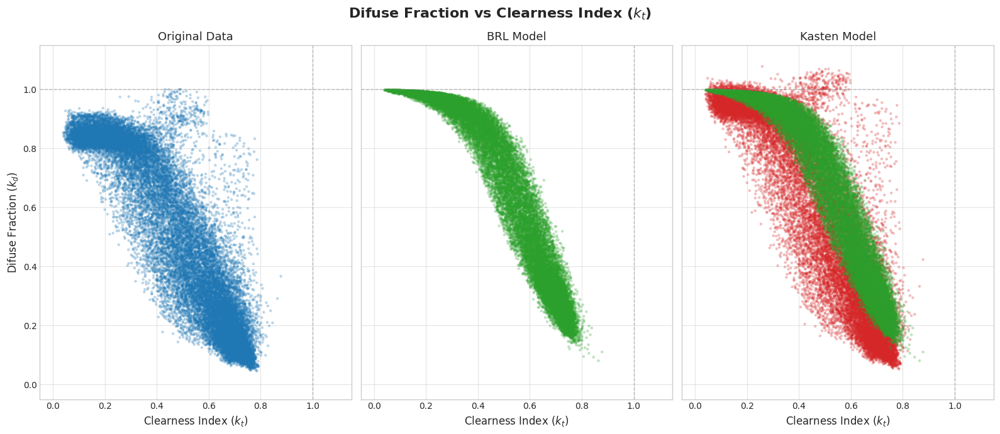

In [35]:
import matplotlib.pyplot as plt
import numpy as np

x = df_processed['kt']

# --- Configurações de Estilo (Opcional, mas ajuda) ---
# Tenta usar um estilo mais limpo se disponível, senão usa o padrão
try:
    plt.style.use('seaborn-v0_8-whitegrid')
except:
    plt.style.use('ggplot')

# Cria a figura e os eixos
fig, ax = plt.subplots(1, 3, figsize=(16, 7), sharey=True, sharex=True)

# Título Geral da Figura
fig.suptitle('Difuse Fraction vs Clearness Index ($k_t$)', 
             fontsize=16, y=0.98, fontweight='bold')

# --- Parâmetros visuais dos pontos ---
marker_style = {
    's': 10,           # Tamanho do ponto (menor é melhor para muitos dados)
    'alpha': 0.3,     # Transparência crucial para ver densidade
    'edgecolor': 'none' # Remove borda do ponto para suavizar
}

# =============================================================================
# PLOT 1: DADOS ANTIGOS (Esquerda)
# =============================================================================
# Usando uma cor fria (ex: azul 'tab:blue')
ax[0].scatter(x, 
              df_processed['fracao_difusa'], 
              color='tab:blue', label='Dados Originais', **marker_style)

ax[0].set_title("Original Data", fontsize=13)
ax[0].set_ylabel("Difuse Fraction ($k_d$)", fontsize=12) # Rótulo Y só no primeiro


# =============================================================================
# PLOT 2: NOVO BRL (Direita)
# =============================================================================
# Usando uma cor de destaque (ex: vermelho/laranja 'tab:red' ou verde 'tab:green')
# para diferenciar do gráfico anterior.
ax[1].scatter(x, 
              df_processed['fracao_difusa_brl'], 
              color='tab:green', label='Modelo BRL Calculado', **marker_style)

ax[1].set_title("BRL Model", fontsize=13)



ax[2].scatter(x, 
              df_processed['fracao_difusa_kasten'], 
              color='tab:red', label='Modelo Kasten', **marker_style)
ax[2].scatter(x, 
              df_processed['fracao_difusa_brl'], 
              color='tab:green', label='Modelo BRL Calculado', **marker_style)

ax[2].set_title("Kasten Model", fontsize=13)

# =============================================================================
# CONFIGURAÇÕES COMUNS (Loop para aplicar a ambos)
# =============================================================================
for axis in ax:
    axis.set_xlabel("Clearness Index ($k_t$)", fontsize=12)
    
    # Grid mais suave
    axis.grid(True, which='major', linestyle='-', alpha=0.6, color='lightgray')
    
    # Linhas de referência física (Limites em 1.0)
    axis.axhline(1.0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
    axis.axvline(1.0, color='gray', linestyle='--', linewidth=1, alpha=0.5)

    # Limites dos eixos (Focando na área de interesse 0 a 1, com pequena margem)
    axis.set_xlim([-0.05, 1.15]) 
    axis.set_ylim([-0.05, 1.15])
    
    # Opcional: Adicionar legenda se quiser destacar o que são os pontos
    # axis.legend(loc='upper right', frameon=True)

# Ajusta o layout para não cortar títulos
plt.tight_layout()

# Mostra o gráfico
plt.show()

In [14]:
df_processed.columns

Index(['target', 'ghi', 'dhi', 'irrad_poa', 'temp_amb', 'humidity',
       'wind_speed', 'Pressão Baromêtrica mm Hg', 'Pluviômetro mm', 'zenith',
       'apparent_zenith', 'azimuth', 'elevation', 'extra_rad', 'dni_extra',
       'am_abs', 'cos_zenith', 'sin_azimuth', 'ghi_extra', 'is_clear_moment',
       'is_clear_day', 'linke_turbidity_calc', 'dhi_cs', 'ghi_cs', 'dni_cs',
       'kt', 'dni', 'temp_cell', 'pot_cs', 'k', 'P1', 'P2', 'P3',
       'fracao_difusa', 'direct_fraction', 'irr_clearsky_ratio', 'mask',
       'fracao_difusa_brl', 'dhi_corrected_kasten'],
      dtype='object')

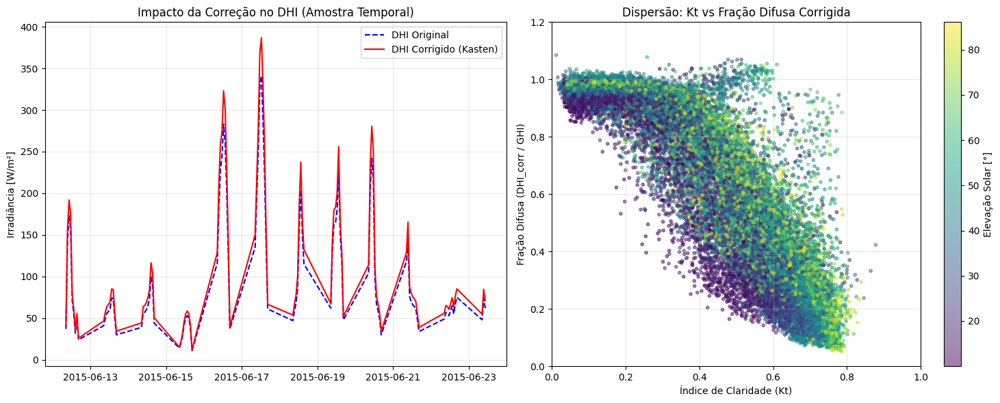

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def apply_kasten_correction(df):
    """
    Aplica o fator de correção de Kasten et al. (KA) aos dados de DHI e gera gráficos.
    """
    # Trabalhar em uma cópia para segurança
    data = df.copy()
    
    # Constantes do modelo Kasten (KA)
    A = 1.161
    B = -0.112
    C = 0.0009
    D = -0.0246
    
    # 1. Filtro de segurança: Aplicar apenas quando há sol suficiente
    # Evita erros matemáticos em GHI_extra=0 ou Elevação negativa
    mask_valid = (data['ghi_extra'] > 10) & (data['elevation'] > 0)
    
    # Variáveis Auxiliares (usando numpy para vetorização rápida)
    # k_du = G_du / G_0h
    k_du = data.loc[mask_valid, 'dhi'] / data.loc[mask_valid, 'ghi_extra']
    
    # k_t já existe no seu dataframe
    kt = data.loc[mask_valid, 'kt']
    
    # tau_bu = kt - k_du
    tau_bu = kt - k_du
    
    # --- TRATAMENTO DE SINGULARIDADES ---
    # O modelo tem log(1/tau_bu). Se tau_bu <= 0 ou tau_bu = 1, isso falha.
    # Clip para manter dentro de um intervalo seguro (0.001 a 0.999)
    tau_bu = tau_bu.clip(lower=0.001, upper=0.999)
    
    # --- CÁLCULO DOS TERMOS ---
    # Termo Cúbico: B * (k_du / kt)^3
    # Evitar divisão por zero se kt for nulo (muito raro de dia, mas possível)
    kt_safe = kt.replace(0, np.nan) 
    term1 = B * (k_du / kt_safe)**3
    
    # Termo Linear: C * delta (elevação)
    term2 = C * data.loc[mask_valid, 'elevation']
    
    # Termo Logarítmico: D / ln(1/tau_bu)
    # ln(1/x) = -ln(x)
    term3 = D / np.log(1 / tau_bu)
    
    # Fator de Correção f
    f = A + term1 + term2 + term3
    
    # Salvar nos dados
    data.loc[mask_valid, 'kasten_f'] = f
    data.loc[mask_valid, 'dhi_corrected'] = data.loc[mask_valid, 'dhi'] * f
    
    # Preencher falhas (noite) com o valor original ou 0
    data['dhi_corrected'] = data['dhi_corrected'].fillna(data['dhi'])
    
    # Recalcular Fração Difusa (DHI Corrigido / GHI Global)
    # Assumindo que você quer ver a proporção em relação ao GHI original
    # (Proteção contra divisão por zero no GHI)
    ghi_safe = data['ghi'].replace(0, np.nan)
    data['fracao_difusa_corrigida'] = data['dhi_corrected'] / ghi_safe
    
    return data

# --- EXECUÇÃO (Substitua 'seu_dataframe' pelo nome real da sua variável) ---
df_final = apply_kasten_correction(df_processed)

# --- PLOTAGEM DOS GRÁFICOS SOLICITADOS ---
# Usaremos 'df_final' assumindo que a função acima rodou
def plot_kasten_results(df_res):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Filtro para plotar apenas dados diurnos válidos para melhor visualização
    plot_data = df_res[df_res['ghi'] > 10]
    
    # Gráfico 1: Comparação Temporal (Exemplo com os primeiros 100 pontos ou um dia específico)
    # Se o dataset for muito grande, plotamos apenas uma fatia.
    subset = plot_data.iloc[:100] # Pegando uma amostra para o gráfico de linha não ficar poluído
    ax1.plot(subset.index, subset['dhi'], label='DHI Original', linestyle='--', color='blue')
    ax1.plot(subset.index, subset['dhi_corrected'], label='DHI Corrigido (Kasten)', color='red')
    ax1.set_title('Impacto da Correção no DHI (Amostra Temporal)')
    ax1.set_ylabel('Irradiância [W/m²]')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Gráfico 2: Kt (Eixo X) vs Fração Difusa Corrigida (Eixo Y)
    # Scatter plot
    sc = ax2.scatter(plot_data['kt'], plot_data['fracao_difusa_corrigida'], 
                     c=plot_data['elevation'], cmap='viridis', alpha=0.5, s=10)
    
    ax2.set_title('Dispersão: Kt vs Fração Difusa Corrigida')
    ax2.set_xlabel('Índice de Claridade (Kt)')
    ax2.set_ylabel('Fração Difusa (DHI_corr / GHI)')
    ax2.set_ylim(0, 1.2) # Limite para focar na área de interesse
    ax2.set_xlim(0, 1.0)
    
    # Barra de cores para a elevação
    cbar = plt.colorbar(sc, ax=ax2)
    cbar.set_label('Elevação Solar [°]')
    
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

plot_kasten_results(df_final)

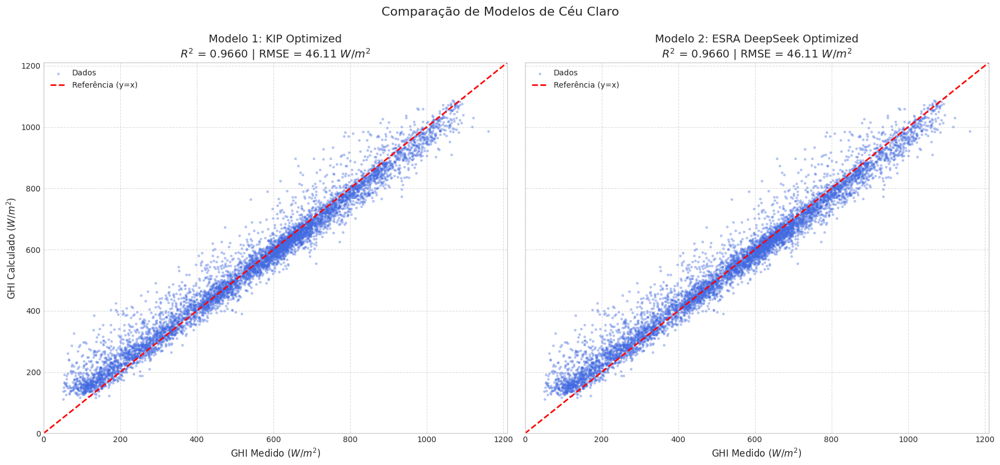

In [8]:
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# --- 1. Preparação dos Dados ---

# Filtro: Apenas Dias Claros E Período Diurno
mask_plot = (df_processed['is_clear_day']) & (df_processed['ghi'] > 10)
data_scatter = df_processed.loc[mask_plot]

# Definição das variáveis para o PLOT 1
x1 = data_scatter['ghi']       # Medido (Eixo X)
y1 = data_scatter['ghi_cs']  # Modelo 1 (Eixo Y)

# Definição das variáveis para o PLOT 2 (Exemplo: outro modelo ou outra condição)
# SE VOCÊ NÃO TIVER UM SEGUNDO MODELO AINDA, PODE USAR y1 APENAS PARA TESTAR
x2 = data_scatter['ghi']           # Medido (Geralmente é o mesmo X)
y2 = data_scatter['ghi_cs']  # <--- SUBSTITUA ISSO PELA SUA SEGUNDA COLUNA DE DADOS


# --- 2. Configuração da Figura com Subplots ---

# Cria uma figura com 1 linha e 2 colunas
# sharey=True faz com que ambos compartilhem a escala do eixo Y (bom para comparações)
fig, axes = plt.subplots(1, 2, figsize=(18, 9), sharey=True)

# Define o limite máximo para os eixos (baseado no maior valor encontrado em todos os dados)
limit = max(x1.max(), y1.max(), y2.max()) + 50

# --- 3. Função Auxiliar para Plotagem (evita repetir código) ---

def plot_scatter(ax, x_data, y_data, title_prefix):
    # Calcular Métricas
    r2 = r2_score(x_data, y_data)
    rmse = np.sqrt(mean_squared_error(x_data, y_data))
    
    # Scatter dos pontos
    ax.scatter(x_data, y_data, alpha=0.3, s=6, color='royalblue', label='Dados')
    
    # Linha de Identidade (y=x)
    ax.plot([0, limit], [0, limit], color='red', linestyle='--', linewidth=2, label='Referência (y=x)')
    
    # Configurações do gráfico individual
    ax.set_title(f'{title_prefix}\n$R^2$ = {r2:.4f} | RMSE = {rmse:.2f} $W/m^2$', fontsize=14)
    ax.set_xlabel('GHI Medido ($W/m^2$)', fontsize=12)
    ax.grid(True, which='both', linestyle='--', alpha=0.7)
    ax.set_xlim(0, limit)
    ax.set_ylim(0, limit)
    ax.legend()

# --- 4. Gerar os Gráficos ---

# Plot 1 (Esquerda) -> Acessamos via axes[0]
plot_scatter(axes[0], x1, y1, "Modelo 1: KIP Optimized")
axes[0].set_ylabel('GHI Calculado ($W/m^2$)', fontsize=12) # Rótulo Y apenas no primeiro

# Plot 2 (Direita) -> Acessamos via axes[1]
plot_scatter(axes[1], x2, y2, "Modelo 2: ESRA DeepSeek Optimized")

# Título Geral da Figura (Opcional)
plt.suptitle('Comparação de Modelos de Céu Claro', fontsize=16, y=0.95)

# Ajuste fino do layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Deixa espaço para o suptitle

# Salvar e Mostrar
# plt.savefig('validacao_comparativa.png', dpi=300)
plt.show()

# Santiago

## Preparação dos dados

In [9]:
CONFIG = {
    # --- 1. PATH DA BASE DE DADOS ---
    'csv_path': 'data/pv0.csv',
    
    # --- 2. DIVISÃO DA BASE DE TREINO, TESTE E VALIDAÇÃO ---
    'split_ratios': {'train': 0.8, 'val': 0.2}, 
    'test_year':2022,

    # --- 3. PRÉ-PROCESSAMENTO (Física & Mapeamento) ---
    'preprocessing': {
        'latitude': -33.5,
        'longitude': -70.61,
        'altitude': 570,
        'timezone': 'Etc/GMT+4',
        'nominal_power': 156.0,
        'start_year': 2023,
        'features_to_scale':['temp_amb','wind_speed'],
        #'pv_power_col_csv': 'Pot_BT', # <--- AVALIAR PARA RETIRAR
        
        # DOCUMENTAÇÃO VIVA: Mapeamento "De -> Para"
        # O Preprocessor usará isso para renomear as colunas internamente.
        # Chave (Esquerda): Nome como está no CSV bruto.
        # Valor (Direita): Nome padronizado usado no código.
        'column_mapping': {
            #'Pot_BT': 'target',
            #'Irradiação Global horária(horizontal) kWh/m2': 'irrad_poa',
            'pirohel_Avg': 'dni',
            'Piracen_Avg': 'ghi',
            'Piraizq_Avg': 'dhi',
            'AirTC_Avg': 'temp_amb',
            'RH': 'humidity',
            'WS_ms_Avg': 'wind_speed'
        }
    },

    # --- 4. ESTRATÉGIA DE MODELAGEM ---
    # mode: 'clearsky_ratio' (prevê k) ou 'direct' (prevê kW normalizado)
    'prediction_mode': 'clearsky_ratio',
    
    # Qual variável o modelo vai prever? ('k' ou 'target')
    'target_col': 'k', 
    
    # Features de entrada
    'feature_cols': [
        'temp_amb', 'wind_speed', 'humidity',  
        'fracao_difusa', 'irr_clearsky_ratio', 'kt'
    ],

    # --- 5. ARQUITETURA E TREINO ---
    'model_type': 'Teste_2',
    'cell_type': 'lstm',
    'input_seq_len': 24,
    'output_seq_len': 1,
    'hidden_sizes': [128, 64],
    'learning_rate': 0.001,
    'batch_size': 32,
    'epochs': 100,
    'dropout': 0.1,
    'bidirectional': False,
    'use_attention': False,
    'use_feature_attention': False,
    'patience': 10,
    'loss_function':'cpi_loss'      # "cpi_loss", "mse"
}

OUTPUT_ROOT = 'trained_models'
ARTIFACTS_DIR = 'artifacts'
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [10]:
df = pd.read_csv('../data/dados_uc.csv', header=0, skiprows=[0,2,3], index_col=0)
df.index = pd.to_datetime(df.index)
df['pirohel_Avg'] = df['pirohel_Avg'].astype(float)

df[['pirohel_Avg','Piracen_Avg', 'Piraizq_Avg', 'Pirader_Avg']] *= 1000

df.index = df.index.tz_localize('UTC')
df.index = df.index.tz_convert('Etc/GMT+4')

# 1. Setup
timestamp = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
exp_name = f"{timestamp}_{CONFIG['model_type']}"
exp_dir = os.path.join(OUTPUT_ROOT, exp_name)
os.makedirs(exp_dir, exist_ok=True)
os.makedirs(ARTIFACTS_DIR, exist_ok=True)

df.head()

,RECORD,BattV_Avg,PTemp_C_Avg,Piraizq_Avg,Pirader_Avg,Piracen_Avg,pirohel_Avg,AirTC_Avg,RH,WS_ms_Avg,WindDir,Rain_mm_Tot
TIMESTAMP,,,,,,,,,,,,
2022-12-31 20:00:00-04:00,4984,13.01,17.75,0.0,0.0,0.0,0.0,17.01,73.82,0.000,236.0,0.0
2022-12-31 20:01:00-04:00,4985,13.01,17.73,0.0,0.0,0.0,0.0,17.01,73.82,0.103,173.9,0.0
2022-12-31 20:02:00-04:00,4986,13.01,17.70,0.0,0.0,0.0,0.0,17.02,73.68,0.457,218.7,0.0
2022-12-31 20:03:00-04:00,4987,13.01,17.69,0.0,0.0,0.0,0.0,16.98,73.68,0.235,186.8,0.0
2022-12-31 20:04:00-04:00,4988,13.00,17.67,0.0,0.0,0.0,0.0,16.98,73.82,0.101,219.5,0.0


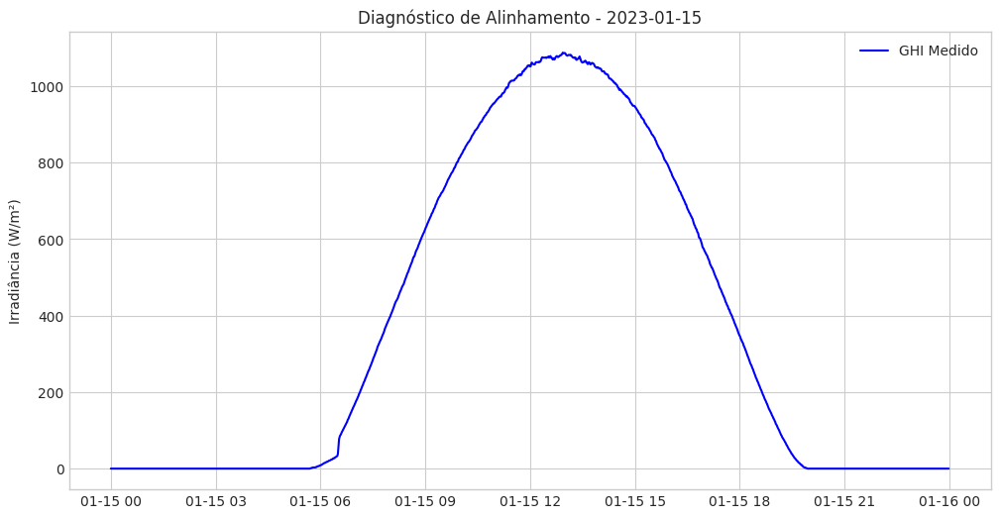

In [11]:
import matplotlib.pyplot as plt

# Escolha uma data de verão (ex: 15 de Janeiro ou Dezembro) onde você espera sol
# Substitua pela data que existir no seu dataset
dia_teste = '2023-01-15' 

# 1. Selecionar dados desse dia
mask = (df.index.date == pd.to_datetime(dia_teste).date())
df_dia = df[mask]

# 2. Gerar o Clear Sky de referência (TL=3) para esse dia
#cs_dia = site.get_clearsky(df_dia.index, model='ineichen', linke_turbidity=3)

# 3. Plotar
plt.figure(figsize=(12, 6))
plt.plot(df_dia.index, df_dia['Piracen_Avg'], label='GHI Medido', color='blue')
#plt.plot(df_dia.index, cs_dia['ghi'], label='GHI Modelo (TL=3)', color='red', linestyle='--')
plt.title(f'Diagnóstico de Alinhamento - {dia_teste}')
plt.ylabel('Irradiância (W/m²)')
plt.legend()
plt.grid(True)
plt.show()

In [12]:
# 3. Pré-processamento
pp_conf = CONFIG['preprocessing']

# Instancia passando o mapa explícito. 
# Isso garante que a padronização aconteça conforme o CONFIG acima.
preprocessor = SolarPreprocessor(
    latitude=pp_conf['latitude'], 
    longitude=pp_conf['longitude'], 
    altitude=pp_conf['altitude'],
    timezone=pp_conf['timezone'], 
    nominal_power=pp_conf['nominal_power'], 
    start_year=pp_conf['start_year'],
    cs_model = 'esra',
    features_to_scale=pp_conf['features_to_scale'],
    target_col=CONFIG['target_col'], # <--- unica variavel que não vem do preprocessing
    column_mapping=pp_conf['column_mapping'] 
)

preprocessor.fit(df)
preprocessor.save_scalers(exp_dir)
preprocessor.save_scalers(ARTIFACTS_DIR)

# O método transform usa o column_mapping para renomear as colunas
df_processed = preprocessor.transform(df)

⚠️ Removendo 7166 duplicatas no índice.
💾 Scalers salvos em: trained_models/2026-01-22_15-18-49_Teste_2
💾 Scalers salvos em: artifacts
⚠️ Removendo 7166 duplicatas no índice.
Otimizando TL para 407 dias selecionados...
Otimização concluída. Média TL: 4.65


## Dados em Minutos

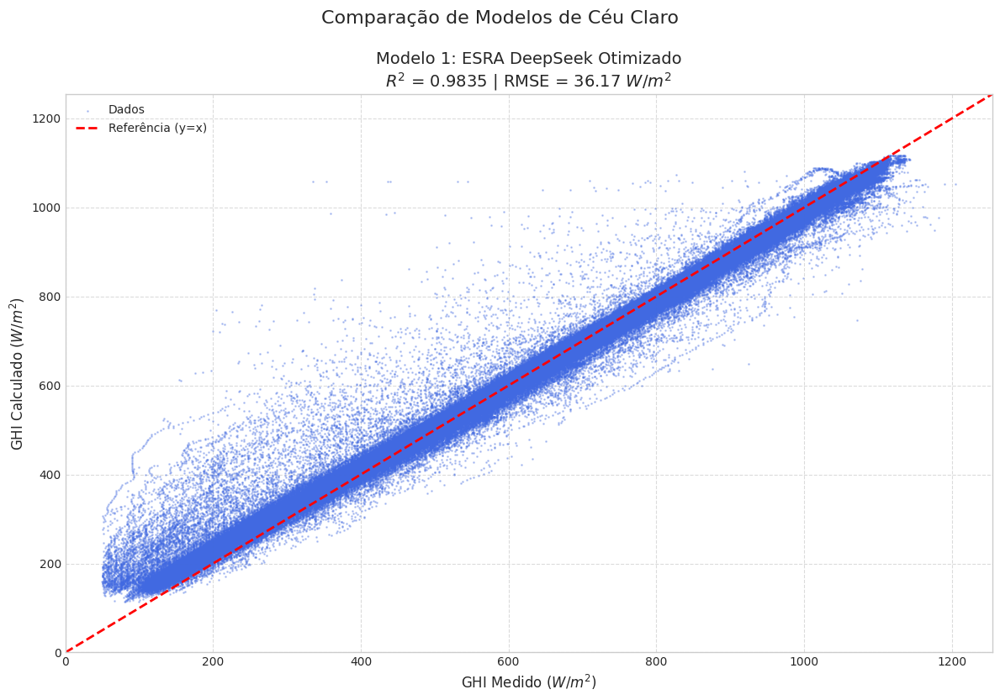

In [14]:
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# --- 1. Preparação dos Dados ---

# Filtro: Apenas Dias Claros E Período Diurno
mask_plot = (df_processed['is_clear_day']) & (df_processed['ghi'] > 10)
data_scatter = df_processed.loc[mask_plot]

# Definição das variáveis para o PLOT 1
x1 = data_scatter['ghi']       # Medido (Eixo X)
y1 = data_scatter['ghi_cs']  # Modelo 1 (Eixo Y)

# --- 2. Configuração da Figura com Subplots ---

# Cria uma figura com 1 linha e 2 colunas
# sharey=True faz com que ambos compartilhem a escala do eixo Y (bom para comparações)
fig, axes = plt.subplots(figsize=(12, 9), sharey=True)

# Define o limite máximo para os eixos (baseado no maior valor encontrado em todos os dados)
limit = max(x1.max(), y1.max(), y2.max()) + 50

# --- 3. Função Auxiliar para Plotagem (evita repetir código) ---

def plot_scatter(ax, x_data, y_data, title_prefix):
    # Calcular Métricas
    r2 = r2_score(x_data, y_data)
    rmse = np.sqrt(mean_squared_error(x_data, y_data))
    
    # Scatter dos pontos
    ax.scatter(x_data, y_data, alpha=0.3, s=1, color='royalblue', label='Dados')
    
    # Linha de Identidade (y=x)
    ax.plot([0, limit], [0, limit], color='red', linestyle='--', linewidth=2, label='Referência (y=x)')
    
    # Configurações do gráfico individual
    ax.set_title(f'{title_prefix}\n$R^2$ = {r2:.4f} | RMSE = {rmse:.2f} $W/m^2$', fontsize=14)
    ax.set_xlabel('GHI Medido ($W/m^2$)', fontsize=12)
    ax.grid(True, which='both', linestyle='--', alpha=0.7)
    ax.set_xlim(0, limit)
    ax.set_ylim(0, limit)
    ax.legend()

# --- 4. Gerar os Gráficos ---

# Plot 1 (Esquerda) -> Acessamos via axes[0]
plot_scatter(axes, x1, y1, "Modelo 1: ESRA DeepSeek Otimizado")
axes.set_ylabel('GHI Calculado ($W/m^2$)', fontsize=12) # Rótulo Y apenas no primeiro


# Título Geral da Figura (Opcional)
plt.suptitle('Comparação de Modelos de Céu Claro', fontsize=16, y=0.95)

# Ajuste fino do layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Deixa espaço para o suptitle

# Salvar e Mostrar
# plt.savefig('validacao_comparativa.png', dpi=300)
plt.show()

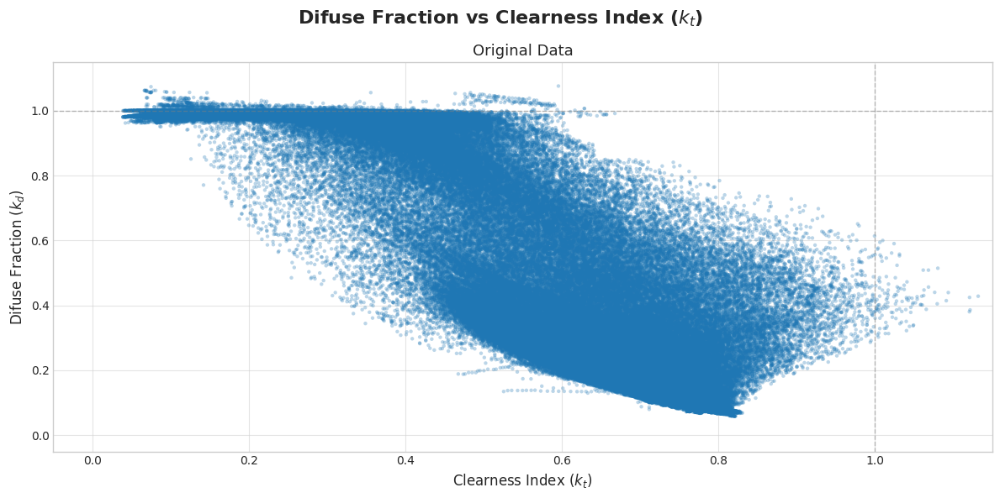

In [29]:
import matplotlib.pyplot as plt
import numpy as np

x = df_processed['kt']

# --- Configurações de Estilo (Opcional, mas ajuda) ---
# Tenta usar um estilo mais limpo se disponível, senão usa o padrão
try:
    plt.style.use('seaborn-v0_8-whitegrid')
except:
    plt.style.use('ggplot')

# Cria a figura e os eixos
fig, ax = plt.subplots(figsize=(12, 6), sharey=True, sharex=True)

# Título Geral da Figura
fig.suptitle('Difuse Fraction vs Clearness Index ($k_t$)', 
             fontsize=16, y=0.98, fontweight='bold')

# --- Parâmetros visuais dos pontos ---
marker_style = {
    's': 10,           # Tamanho do ponto (menor é melhor para muitos dados)
    'alpha': 0.3,     # Transparência crucial para ver densidade
    'edgecolor': 'none' # Remove borda do ponto para suavizar
}

# =============================================================================
# PLOT 1: DADOS ANTIGOS (Esquerda)
# =============================================================================
# Usando uma cor fria (ex: azul 'tab:blue')
ax.scatter(x, 
              df_processed['fracao_difusa'], 
              color='tab:blue', label='Dados Originais', **marker_style)

ax.set_title("Original Data", fontsize=13)
ax.set_ylabel("Difuse Fraction ($k_d$)", fontsize=12) # Rótulo Y só no primeiro

# =============================================================================
# CONFIGURAÇÕES COMUNS (Loop para aplicar a ambos)
# =============================================================================
ax.set_xlabel("Clearness Index ($k_t$)", fontsize=12)

# Grid mais suave
ax.grid(True, which='major', linestyle='-', alpha=0.6, color='lightgray')

# Linhas de referência física (Limites em 1.0)
ax.axhline(1.0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
ax.axvline(1.0, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Limites dos eixos (Focando na área de interesse 0 a 1, com pequena margem)
ax.set_xlim([-0.05, 1.15]) 
ax.set_ylim([-0.05, 1.15])
    
    # Opcional: Adicionar legenda se quiser destacar o que são os pontos
    # axis.legend(loc='upper right', frameon=True)

# Ajusta o layout para não cortar títulos
plt.tight_layout()

# Mostra o gráfico
plt.show()

## Dados Horários

In [18]:
df_hour = df_processed[['kt','fracao_difusa', 'ghi_extra', 'linke_turbidity_calc', 'am_abs', 'dni_extra',
            'temp_amb', 'humidity', 'wind_speed']].resample('H').mean()
df_hour.index = df_hour.index + pd.Timedelta(minutes=30)
df_hour.head()

,kt,fracao_difusa,ghi_extra,linke_turbidity_calc,am_abs,dni_extra,temp_amb,humidity,wind_speed
TIMESTAMP,,,,,,,,,
2023-01-01 06:30:00-04:00,0.447550,0.629166,308.036207,4.217543,4.235803,1413.981805,0.391223,0.778369,0.021517
2023-01-01 07:30:00-04:00,0.565659,0.463275,509.751486,4.217543,2.634342,1413.981805,0.450575,0.682590,0.034747
2023-01-01 08:30:00-04:00,0.690400,0.482764,777.714192,4.217543,1.708886,1413.981805,0.533341,0.570115,0.038104
2023-01-01 09:30:00-04:00,0.712037,0.289625,1013.489241,4.217543,1.306507,1413.981805,0.560382,0.535293,0.065010
2023-01-01 10:30:00-04:00,0.757235,0.196732,1201.012740,4.217543,1.100682,1413.981805,0.611952,0.460467,0.080491


In [19]:
df_hour['ghi'] = df_hour['ghi_extra'] * df_hour['kt']
df_hour['dhi'] = df_hour['ghi'] * df_hour['fracao_difusa']
#df_hour['dni'] = (df_hour['ghi'] - df_hour['dhi'])/

In [21]:
# 3. Pré-processamento
pp_conf = CONFIG['preprocessing']

# Instancia passando o mapa explícito. 
# Isso garante que a padronização aconteça conforme o CONFIG acima.
preprocessor = SolarPreprocessor(
    latitude=pp_conf['latitude'], 
    longitude=pp_conf['longitude'], 
    altitude=pp_conf['altitude'],
    timezone=pp_conf['timezone'], 
    nominal_power=pp_conf['nominal_power'], 
    start_year=pp_conf['start_year'],
    features_to_scale=[],
    target_col=CONFIG['target_col'], # <--- unica variavel que não vem do preprocessing
    column_mapping={}
)

preprocessor.fit(df_hour)
preprocessor.save_scalers(exp_dir)
preprocessor.save_scalers(ARTIFACTS_DIR)

# O método transform usa o column_mapping para renomear as colunas
df_processed_hour = preprocessor.transform(df_hour)

💾 Scalers salvos em: trained_models/2026-01-22_15-18-49_Teste_2
💾 Scalers salvos em: artifacts
Otimizando TL para 440 dias selecionados...
Otimização concluída. Média TL: 4.94


In [25]:
#=============
#   Kasten
#=============

dados_corrigidos = Kasten_Correction(df_processed_hour)
df_processed_hour['dhi_corrected_kasten'] = dados_corrigidos['dhi_corrected']
df_processed_hour['fracao_difusa_kasten'] = df_processed_hour['dhi_corrected_kasten'] / df_processed_hour['ghi']
del(dados_corrigidos)

#=============
#    BRL
#=============

pp = CONFIG['preprocessing']
lat = pp['latitude']  
lon = pp['longitude']  
tz = pp['timezone']  

betas = [-6.0424,8.5957, 0.0194, -0.0154, 1.6896, 0.5120]

df_resultado = BRL(df_processed_hour, betas, lon, tz)
df_final = df_processed_hour.join(df_resultado)

if df_final.index.tz is None:
    df_final.index = df_final.index.tz_localize('UTC').tz_convert(tz)
else:
    df_final.index = df_final.index.tz_convert(tz)

df_processed_hour['fracao_difusa_brl'] = df_final['fracao_difusa_brl']
del(df_final)

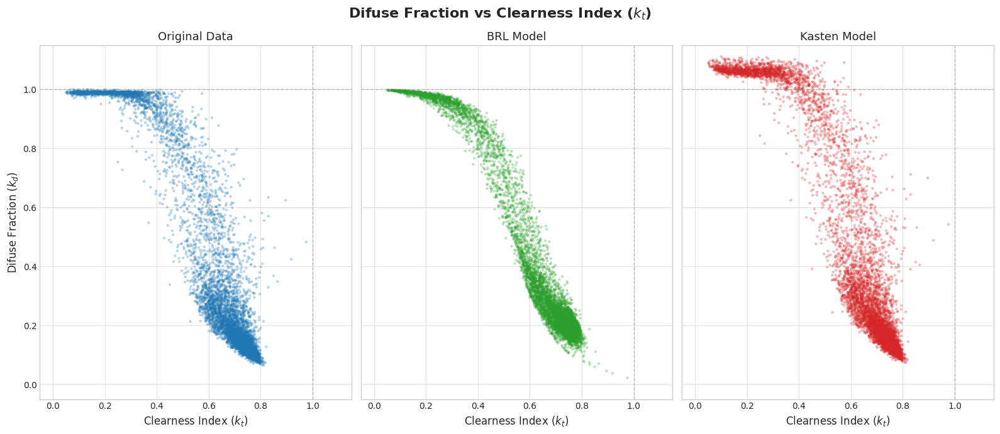

In [26]:
import matplotlib.pyplot as plt
import numpy as np

x = df_processed_hour['kt']

# --- Configurações de Estilo (Opcional, mas ajuda) ---
# Tenta usar um estilo mais limpo se disponível, senão usa o padrão
try:
    plt.style.use('seaborn-v0_8-whitegrid')
except:
    plt.style.use('ggplot')

# Cria a figura e os eixos
fig, ax = plt.subplots(1, 3, figsize=(16, 7), sharey=True, sharex=True)

# Título Geral da Figura
fig.suptitle('Difuse Fraction vs Clearness Index ($k_t$)', 
             fontsize=16, y=0.98, fontweight='bold')

# --- Parâmetros visuais dos pontos ---
marker_style = {
    's': 10,           # Tamanho do ponto (menor é melhor para muitos dados)
    'alpha': 0.3,     # Transparência crucial para ver densidade
    'edgecolor': 'none' # Remove borda do ponto para suavizar
}

# =============================================================================
# PLOT 1: DADOS ANTIGOS (Esquerda)
# =============================================================================
# Usando uma cor fria (ex: azul 'tab:blue')
ax[0].scatter(x, 
              df_processed_hour['fracao_difusa'], 
              color='tab:blue', label='Dados Originais', **marker_style)

ax[0].set_title("Original Data", fontsize=13)
ax[0].set_ylabel("Difuse Fraction ($k_d$)", fontsize=12) # Rótulo Y só no primeiro


# =============================================================================
# PLOT 2: NOVO BRL (Direita)
# =============================================================================
# Usando uma cor de destaque (ex: vermelho/laranja 'tab:red' ou verde 'tab:green')
# para diferenciar do gráfico anterior.
ax[1].scatter(x, 
              df_processed_hour['fracao_difusa_brl'], 
              color='tab:green', label='Modelo BRL Calculado', **marker_style)

ax[1].set_title("BRL Model", fontsize=13)


ax[2].scatter(x, 
              df_processed_hour['fracao_difusa_kasten'], 
              color='tab:red', label='Modelo Kasten', **marker_style)

ax[2].set_title("Kasten Model", fontsize=13)

# =============================================================================
# CONFIGURAÇÕES COMUNS (Loop para aplicar a ambos)
# =============================================================================
for axis in ax:
    axis.set_xlabel("Clearness Index ($k_t$)", fontsize=12)
    
    # Grid mais suave
    axis.grid(True, which='major', linestyle='-', alpha=0.6, color='lightgray')
    
    # Linhas de referência física (Limites em 1.0)
    axis.axhline(1.0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
    axis.axvline(1.0, color='gray', linestyle='--', linewidth=1, alpha=0.5)

    # Limites dos eixos (Focando na área de interesse 0 a 1, com pequena margem)
    axis.set_xlim([-0.05, 1.15]) 
    axis.set_ylim([-0.05, 1.15])
    
    # Opcional: Adicionar legenda se quiser destacar o que são os pontos
    # axis.legend(loc='upper right', frameon=True)

# Ajusta o layout para não cortar títulos
plt.tight_layout()

# Mostra o gráfico
plt.show()

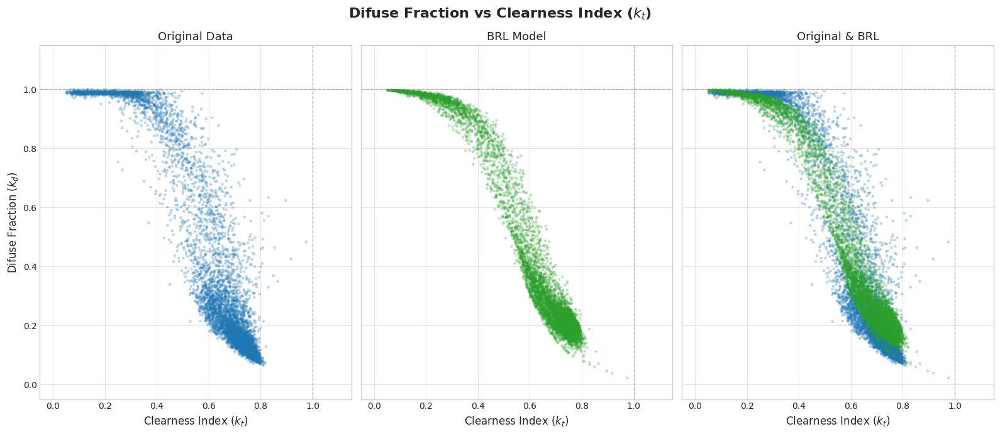

In [30]:
import matplotlib.pyplot as plt
import numpy as np

x = df_processed_hour['kt']

# --- Configurações de Estilo (Opcional, mas ajuda) ---
# Tenta usar um estilo mais limpo se disponível, senão usa o padrão
try:
    plt.style.use('seaborn-v0_8-whitegrid')
except:
    plt.style.use('ggplot')

# Cria a figura e os eixos
fig, ax = plt.subplots(1, 3, figsize=(16, 7), sharey=True, sharex=True)

# Título Geral da Figura
fig.suptitle('Difuse Fraction vs Clearness Index ($k_t$)', 
             fontsize=16, y=0.98, fontweight='bold')

# --- Parâmetros visuais dos pontos ---
marker_style = {
    's': 10,           # Tamanho do ponto (menor é melhor para muitos dados)
    'alpha': 0.3,     # Transparência crucial para ver densidade
    'edgecolor': 'none' # Remove borda do ponto para suavizar
}

# =============================================================================
# PLOT 1: DADOS ANTIGOS (Esquerda)
# =============================================================================
# Usando uma cor fria (ex: azul 'tab:blue')
ax[0].scatter(x, 
              df_processed_hour['fracao_difusa'], 
              color='tab:blue', label='Dados Originais', **marker_style)

ax[0].set_title("Original Data", fontsize=13)
ax[0].set_ylabel("Difuse Fraction ($k_d$)", fontsize=12) # Rótulo Y só no primeiro


# =============================================================================
# PLOT 2: NOVO BRL (Direita)
# =============================================================================
# Usando uma cor de destaque (ex: vermelho/laranja 'tab:red' ou verde 'tab:green')
# para diferenciar do gráfico anterior.
ax[1].scatter(x, 
              df_processed_hour['fracao_difusa_brl'], 
              color='tab:green', label='Modelo BRL Calculado', **marker_style)

ax[1].set_title("BRL Model", fontsize=13)


ax[2].scatter(x, 
              df_processed_hour['fracao_difusa'], 
              color='tab:blue', label='Dados Originais', **marker_style)

ax[2].scatter(x, 
              df_processed_hour['fracao_difusa_brl'], 
              color='tab:green', label='Modelo BRL Calculado', **marker_style)

ax[2].set_title("Original & BRL", fontsize=13)

# =============================================================================
# CONFIGURAÇÕES COMUNS (Loop para aplicar a ambos)
# =============================================================================
for axis in ax:
    axis.set_xlabel("Clearness Index ($k_t$)", fontsize=12)
    
    # Grid mais suave
    axis.grid(True, which='major', linestyle='-', alpha=0.6, color='lightgray')
    
    # Linhas de referência física (Limites em 1.0)
    axis.axhline(1.0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
    axis.axvline(1.0, color='gray', linestyle='--', linewidth=1, alpha=0.5)

    # Limites dos eixos (Focando na área de interesse 0 a 1, com pequena margem)
    axis.set_xlim([-0.05, 1.15]) 
    axis.set_ylim([-0.05, 1.15])
    
    # Opcional: Adicionar legenda se quiser destacar o que são os pontos
    # axis.legend(loc='upper right', frameon=True)

# Ajusta o layout para não cortar títulos
plt.tight_layout()

# Mostra o gráfico
plt.show()